In [ ]:
import marimo as mo

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import fftconvolve
from log_energy_epjst_package.models.white_noise import white_noise
from log_energy_epjst_package.models.brownian_motion import brownian_motion
from MRW_LAMBDA_ESTIMATOR.surrogate_mrw_lambda import generate_mrw
from signal_analysis import analyze_signal, psi_haar_smooth
from toy_models.model5_lognormal_cascade import generate as generate_lognormal_cascade
from toy_models.model8_fbm import fbm_daviesharte as generate_fbm

def covariance_fft(x):
    x = x - np.mean(x)
    c = fftconvolve(x, x[::-1], mode='full')
    c = c[c.size // 2:]
    return c / c[0]

def compare_signals(signals, **analysis_kwargs):
    results = {}
    for name, signal in signals.items():
        results[name] = analyze_signal(signal, **analysis_kwargs)
    return results

def plot_signals(results):
    """Plot the original signals (treated as log-price)."""
    fig, axes = plt.subplots(len(results), 1, figsize=(10, 4 * len(results)), sharex=True)
    if len(results) == 1:
        axes = [axes]
    for ax, (name, output) in zip(axes, results.items()):
        ax.plot(output['signal'])
        ax.set_title(f'{name}: Signal')
        ax.set_ylabel('Value')
    plt.xlabel('Time')
    plt.tight_layout()
    plt.show()

def plot_volatility_walks(results, scale_idx=3):
    """Plot centered log-volatility walks for each signal."""
    fig, axes = plt.subplots(len(results), 1, figsize=(10, 4 * len(results)), sharex=True)
    if len(results) == 1:
        axes = [axes]
    for ax, (name, output) in zip(axes, results.items()):
        w_a = output['log_vol_series'][scale_idx]
        w_a_centered = w_a - np.mean(w_a)
        v_a = np.cumsum(w_a_centered)
        ax.plot(v_a)
        ax.set_title(f"{name}: Centered Log-Volatility Walk (Scale {output['scales'][scale_idx]})")
        ax.set_ylabel('Walk Value')
    plt.xlabel('Time')
    plt.tight_layout()
    plt.show()

def plot_autocorrelations(results, scale_idx=3, max_lag=500):
    """Plot autocorrelations of returns and log-volatility."""
    fig, axes = plt.subplots(len(results), 2, figsize=(12, 4 * len(results)))
    if len(results) == 1:
        axes = axes.reshape(1, -1)
    for i, (name, output) in enumerate(results.items()):
        signal = output['signal']
        ret = np.diff(signal)
        ret_ac = covariance_fft(ret)
        w_a = output['log_vol_series'][scale_idx]
        w_ac = covariance_fft(w_a)
        axes[i, 0].plot(ret_ac[:max_lag + 1])
        axes[i, 0].set_title(f'{name}: Return Autocorrelation')
        axes[i, 0].set_xlabel('Lag')
        axes[i, 0].set_ylabel('Autocorrelation')
        axes[i, 1].plot(w_ac[:max_lag + 1])
        axes[i, 1].set_title(f"{name}: Log-Volatility Autocorrelation (Scale {output['scales'][scale_idx]})")
        axes[i, 1].set_xlabel('Lag')
        axes[i, 1].set_ylabel('Autocorrelation')
    plt.tight_layout()
    plt.show()

def plot_mi_maps(results, max_time_lag,negative=False):
    fig, axes = plt.subplots(1, len(results), figsize=(6 * len(results), 5), sharey=True)
    if len(results) == 1:
        axes = [axes]
    for ax, (name, output) in zip(axes, results.items()):
        im = ax.imshow(output['mi_map'], aspect='auto', origin='upper', extent=[-max_time_lag, max_time_lag, output['scales'][-1], output['scales'][0]])
        ax.set_title(name)
        ax.set_xlabel('Time lag')
        ax.set_ylabel('Scale')
        fig.colorbar(im, ax=ax, label='Mutual Information')
    plt.tight_layout()
    plt.show()
    if not negative:
        for key in results.keys():
            mi_normalized = []
            for i, I in enumerate(results[key]['mi_map']):
                mi_normalized.append(I / np.max(I))
            results[key]['mi_map_normalized'] = mi_normalized
    else:
        for key in results.keys():
            mi_normalized = []
            for i, I in enumerate(results[key]['mi_map']):
                mi_normalized.append((I+np.abs(np.min(I))) / np.abs(np.max(I)-np.min(I)))
            results[key]['mi_map_normalized'] = mi_normalized
    fig, axes = plt.subplots(1, len(results), figsize=(6 * len(results), 5), sharey=True)
    if len(results) == 1:
        axes = [axes]
    for ax, (name, output) in zip(axes, results.items()):
        im = ax.imshow(output['mi_map_normalized'], aspect='auto', origin='upper' , extent=[-max_time_lag, max_time_lag, output['scales'][-1], output['scales'][0]])
        ax.set_title(name)
        ax.set_xlabel('Time lag')
        ax.set_ylabel('Scale')
        fig.colorbar(im, ax=ax, label='Mutual Information normalized')
    plt.tight_layout()
    plt.show()

# old attempts using pywt

In [ ]:
if __name__ == '__main__':
    _n_samples = 50000
    _signals = {'white_noise': white_noise(_n_samples), 'brownian_motion': brownian_motion(_n_samples)}
    _results = compare_signals(_signals, wavelet='haar', max_level=8, window=50, ref_idx=0, max_time_lag=10, use_parallel=True, n_jobs=8)
    for _name, _output in _results.items():
        print(f"{_name}: log_vol_series shape = {_output['log_vol_series'].shape}, mi_map shape = {_output['mi_map'].shape}")
    plot_signals(_results)
    plot_volatility_walks(_results, scale_idx=3)
    plot_autocorrelations(_results, scale_idx=3, max_lag=500)
    plot_mi_maps(_results, max_time_lag=10)

In [ ]:
if __name__ == '__main__':
    _n_samples = 2 ** 15
    _signals = {'lognormal_cascade_0.05': generate_lognormal_cascade(_n_samples, 0.05), 'lognormal_cascade_0.1': generate_lognormal_cascade(_n_samples, 0.1), 'lognormal_cascade_0.5': generate_lognormal_cascade(_n_samples, 0.5)}
    _results = compare_signals(_signals, wavelet='haar', max_level=8, window=50, ref_idx=0, max_time_lag=10, use_parallel=True, n_jobs=8)
    for _name, _output in _results.items():
        print(f"{_name}: log_vol_series shape = {_output['log_vol_series'].shape}, mi_map shape = {_output['mi_map'].shape}")
    plot_signals(_results)
    plot_volatility_walks(_results, scale_idx=3)
    plot_autocorrelations(_results, scale_idx=3, max_lag=500)
    plot_mi_maps(_results, max_time_lag=10)

In [ ]:
if __name__ == '__main__':
    _n_samples = 2 ** 10
    _signals = {'mrw_0.05': generate_mrw(_n_samples, 0.05)[0], 'mrw_0.1': generate_mrw(_n_samples, 0.1)[0], 'mrw_0.5': generate_mrw(_n_samples, 0.5)[0]}
    _results = compare_signals(_signals, wavelet='haar', max_level=8, window=50, ref_idx=0, max_time_lag=10, use_parallel=True, n_jobs=8)
    for _name, _output in _results.items():
        print(f"{_name}: log_vol_series shape = {_output['log_vol_series'].shape}, mi_map shape = {_output['mi_map'].shape}")
    plot_signals(_results)
    plot_volatility_walks(_results, scale_idx=3)
    plot_autocorrelations(_results, scale_idx=3, max_lag=500)
    plot_mi_maps(_results, max_time_lag=10)

# new attempts using custom cwt

## toy models
 signal length 10000

In [ ]:
plot_mi_maps(results, max_time_lag=100)

In [ ]:
n_samples = 10000
scales = np.logspace(np.log10(4), np.log10(2000), 25)
signals = {
    'white_noise': white_noise(n_samples),
    'fbm_0.2': generate_fbm(n_samples, 0.2), 
    'fbm_0.5': generate_fbm(n_samples, 0.5), 
    'fbm_0.8': generate_fbm(n_samples, 0.8)
}
results = compare_signals(signals, scales=scales, wavelet=psi_haar_smooth, max_level=8, window=50, ref_idx=0, max_time_lag=400, use_parallel=True, n_jobs=8)

for name, output in results.items():
    print(f"{name}: log_vol_series shape = {output['log_vol_series'].shape}, mi_map shape = {output['mi_map'].shape}")
plot_signals(results)
plot_volatility_walks(results, scale_idx=3)
plot_autocorrelations(results, scale_idx=3, max_lag=500)
plot_mi_maps(results, max_time_lag=400)

Traceback (most recent call last):
  File "<string>", line 1, in <module>
    from multiprocess.spawn import spawn_main; spawn_main(parent_pid=2692, pipe_handle=1296)
                                               ~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\Filip\AppData\Local\Programs\Python\Python313\Lib\site-packages\multiprocess\spawn.py", line 122, in spawn_main
    exitcode = _main(fd, parent_sentinel)
  File "C:\Users\Filip\AppData\Local\Programs\Python\Python313\Lib\site-packages\multiprocess\spawn.py", line 132, in _main
    self = reduction.pickle.load(from_parent)
  File "C:\Users\Filip\AppData\Local\Programs\Python\Python313\Lib\site-packages\dill\_dill.py", line 298, in load
    return Unpickler(file, ignore=ignore, **kwds).load()
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^
  File "C:\Users\Filip\AppData\Local\Programs\Python\Python313\Lib\site-packages\dill\_dill.py", line 453, in load
    obj = StockUnpickler.load(self)
EOFError: Ran out o

interruption: This cell was interrupted and needs to be re-run

In [ ]:
fbm_only = {"fbm_0.8":results["fbm_0.8"]}
plot_mi_maps(fbm_only, max_time_lag=400)

### fbm 0.8
signal lenghth 30000

In [ ]:
plot_mi_maps(results_fbm_2, max_time_lag=600)

In [ ]:
def analyse_fbm():
    n_samples = 30000
    scales = np.logspace(np.log10(4), np.log10(2000), 25)
    signals = {
        'fbm_0.8': generate_fbm(n_samples, 0.8)
    }
    results = compare_signals(signals, scales=scales, wavelet=psi_haar_smooth, max_level=8, window=50, ref_idx=0, max_time_lag=400, use_parallel=True, n_jobs=8)

    for name, output in results.items():
        print(f"{name}: log_vol_series shape = {output['log_vol_series'].shape}, mi_map shape = {output['mi_map'].shape}")
    plot_signals(results)
    plot_volatility_walks(results, scale_idx=3)
    plot_autocorrelations(results, scale_idx=3, max_lag=500)
    plot_mi_maps(results, max_time_lag=400)
    return results
results_fbm = analyse_fbm()

## fbm 0.8
signal length 15000

MI map +/-600

In [ ]:
def analyse_fbm_2():
    n_samples = 15000
    scales = np.logspace(np.log10(4), np.log10(2000), 25)
    signals = {
        'fbm_0.8': generate_fbm(n_samples, 0.8)
    }
    results = compare_signals(signals, scales=scales, wavelet=psi_haar_smooth, max_level=8, window=50, ref_idx=0, max_time_lag=600, use_parallel=True, n_jobs=8)

    for name, output in results.items():
        print(f"{name}: log_vol_series shape = {output['log_vol_series'].shape}, mi_map shape = {output['mi_map'].shape}")
    plot_signals(results)
    plot_volatility_walks(results, scale_idx=3)
    plot_autocorrelations(results, scale_idx=3, max_lag=500)
    plot_mi_maps(results, max_time_lag=400)
    return results
results_fbm_2 = analyse_fbm_2()

In [ ]:
plot_mi_maps(results_fbm_2,max_time_lag=600)

In [ ]:
def analyse_singals_large_window():
    n_samples = 15000
    mi_map_width = 2000
    scales = np.logspace(np.log10(4), np.log10(2000), 25)
    signals = {
        'White noise':white_noise(n_samples),
        'fbm_0.3': generate_fbm(n_samples, 0.3),
        'fbm_0.5': generate_fbm(n_samples, 0.5),
        'fbm_0.8': generate_fbm(n_samples, 0.8)
    }
    results = compare_signals(signals, scales=scales, wavelet=psi_haar_smooth, max_level=8, window=50, ref_idx=0, max_time_lag=mi_map_width, use_parallel=True, n_jobs=8)

    for name, output in results.items():
        print(f"{name}: log_vol_series shape = {output['log_vol_series'].shape}, mi_map shape = {output['mi_map'].shape}")
    plot_signals(results)
    plot_volatility_walks(results, scale_idx=3)
    plot_autocorrelations(results, scale_idx=3, max_lag=500)
    plot_mi_maps(results, max_time_lag=mi_map_width)
    return results
results_fbm_3 = analyse_singals_large_window()

640533


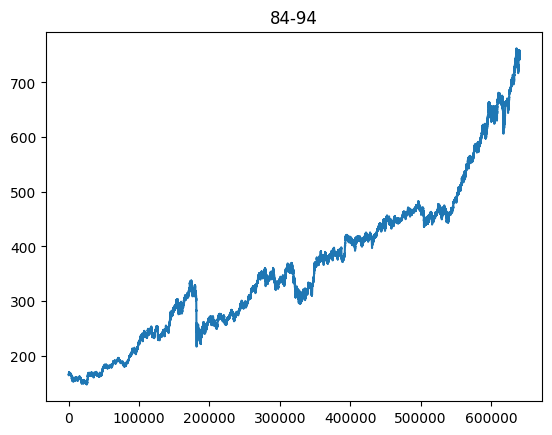

In [ ]:
import pandas as pd

DATA_PATH = "SandP_log2min.dat"   # one value per row

# Try reading with header; if no header, fallback
try:
    df_snp = pd.read_csv(DATA_PATH)
    if df_snp.shape[1] == 1:
        df_snp.columns = ['log_price']
except:
    df_snp = pd.read_csv(DATA_PATH, header=None)
    df_snp.columns = ['log_price']

df_snp = df_snp.dropna().reset_index(drop=True)

# Log-price
df_snp['price'] = 0.01*np.exp(df_snp['log_price'])

print(len(df_snp))
df_snp.head()

plt.plot(0.01*np.exp(df_snp["log_price"]))
plt.title("84-94")
plt.show()

## S&P
signal length 30000

In [ ]:
def analyse_SandP(df):
    log_price = np.array(df['log_price'].values)

    n_samples = 30000
    scales = np.logspace(np.log10(4), np.log10(2000), 25)
    signals = {
        'S&P500': log_price[:n_samples]
    }
    results = compare_signals(signals, scales=scales, wavelet=psi_haar_smooth, max_level=8, window=50, ref_idx=0, max_time_lag=400, use_parallel=True, n_jobs=8)

    for name, output in results.items():
        print(f"{name}: log_vol_series shape = {output['log_vol_series'].shape}, mi_map shape = {output['mi_map'].shape}")
    plot_signals(results)
    plot_volatility_walks(results, scale_idx=3)
    plot_autocorrelations(results, scale_idx=3, max_lag=500)
    plot_mi_maps(results, max_time_lag=400)

    return results


In [ ]:
results_snp = analyse_SandP()

In [ ]:
np.save("mi_map_snp_-30000.npy",results_snp)

In [ ]:
test_load=np.load("mi_map_snp_-30000.npy",allow_pickle=True)

In [ ]:
plt.imshow(test_load.item()["S&P500"]["mi_map_normalized"],aspect="auto")

## S&P
10 batches 30000

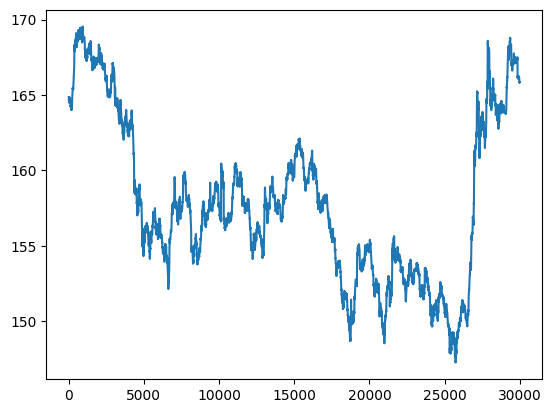

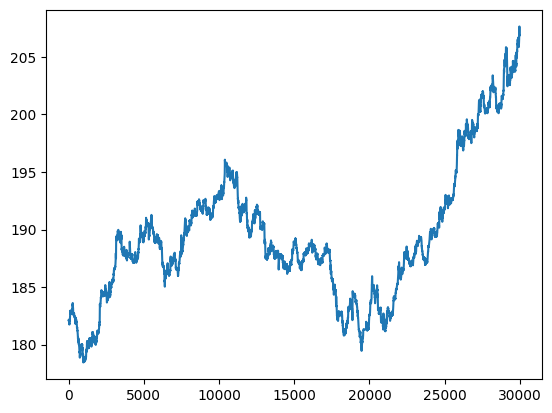

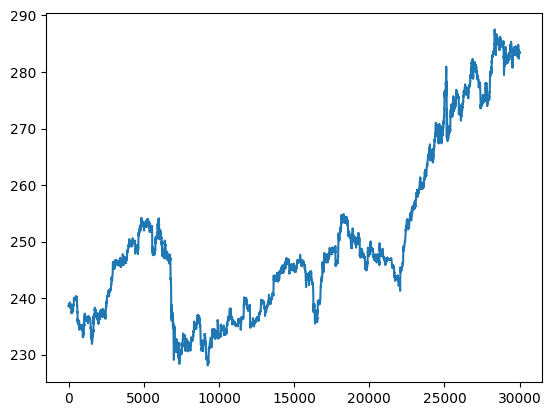

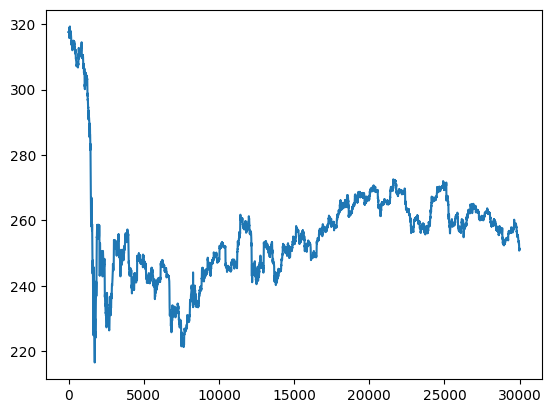

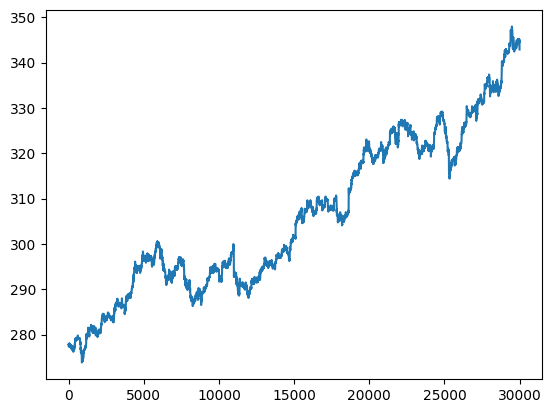

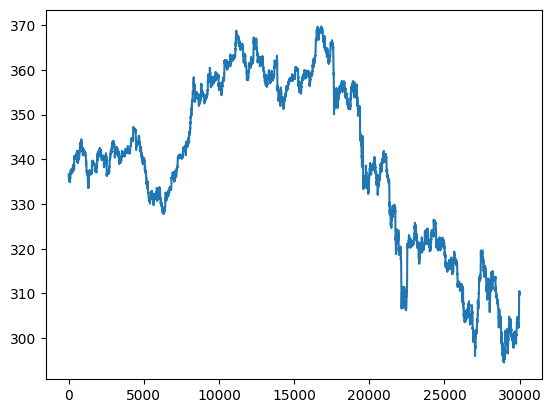

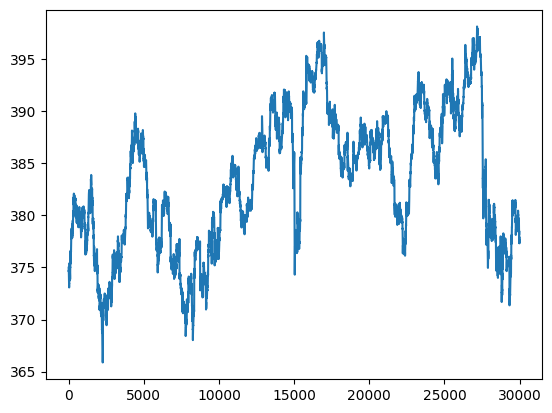

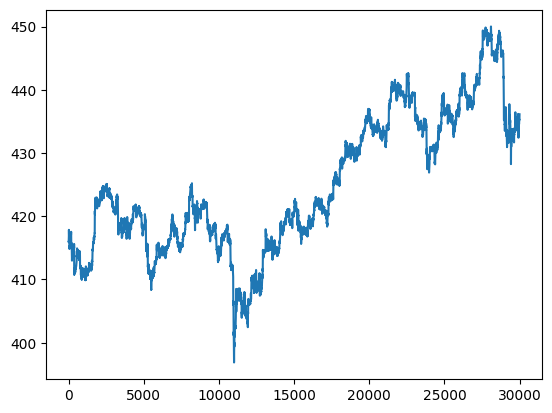

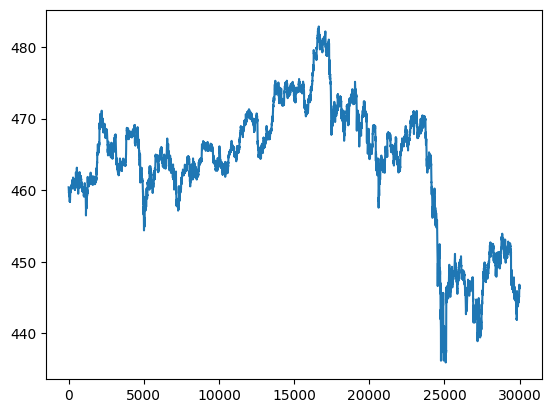

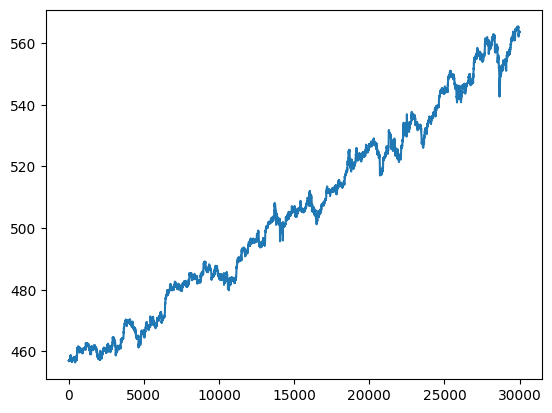

In [ ]:
window_size = 30000
num_windows = 20

windows = [
    df_snp.iloc[i*window_size : (i+1)*window_size].reset_index(drop=True)
    for i in range(num_windows)
]
for w in windows[::2]:
    plt.plot(w["price"])
    plt.show()

S&P500: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


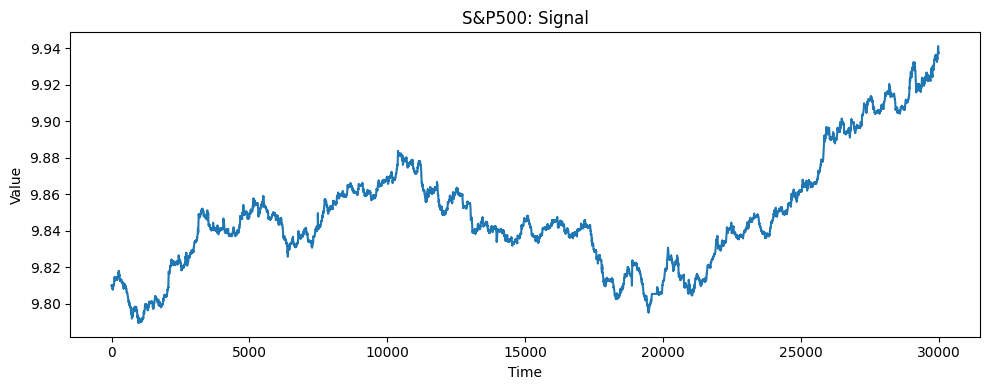

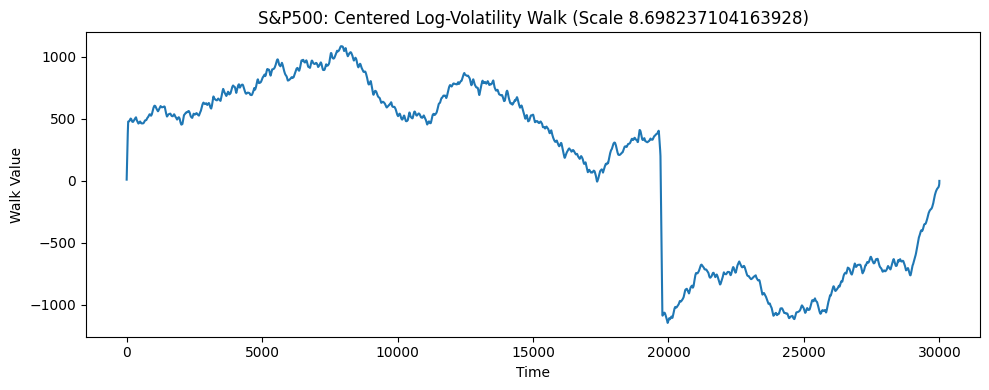

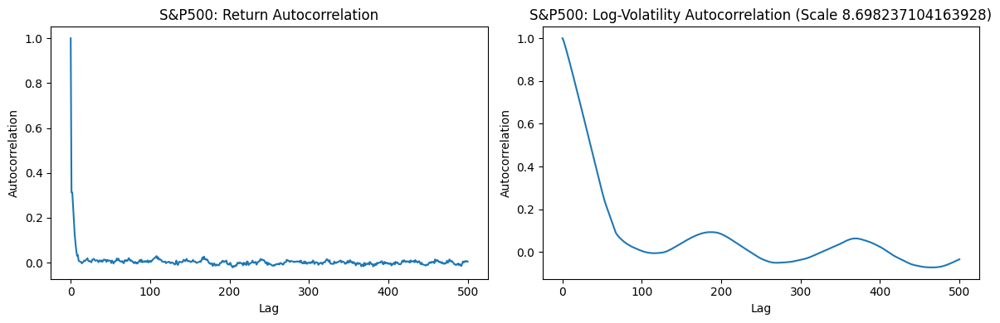

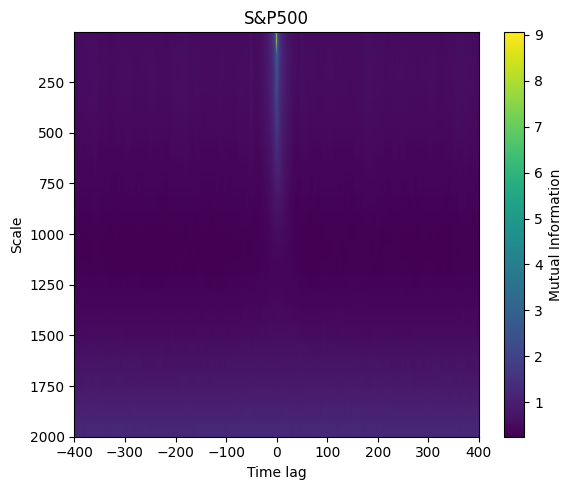

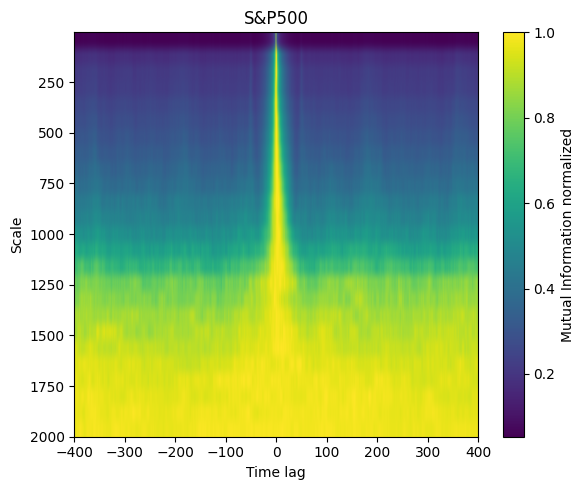

S&P500: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


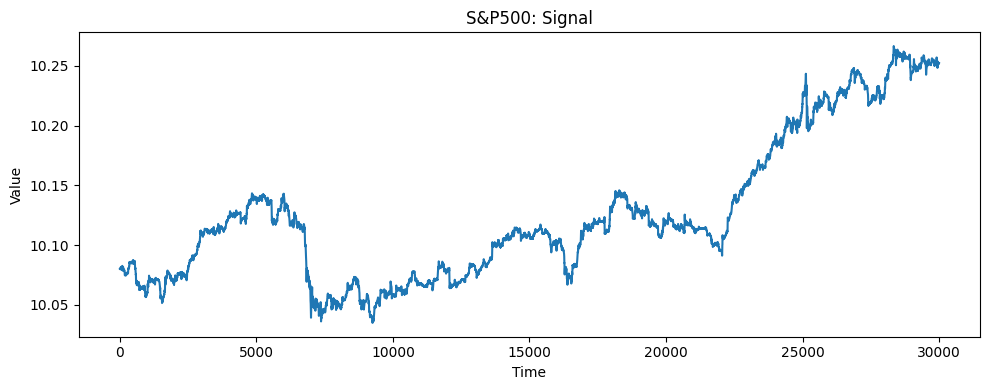

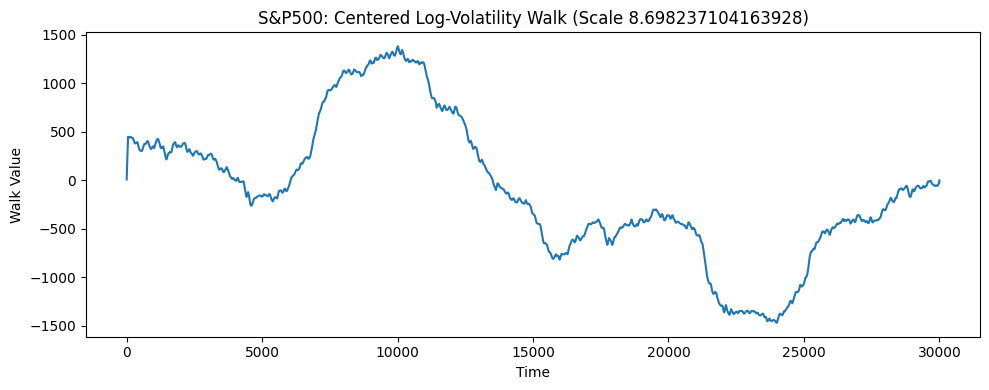

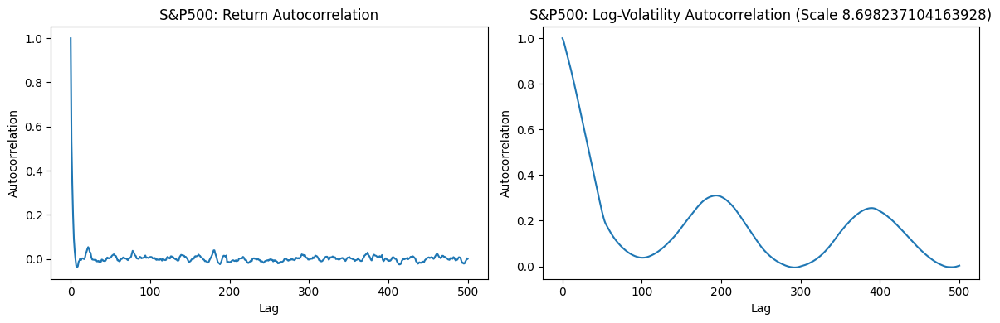

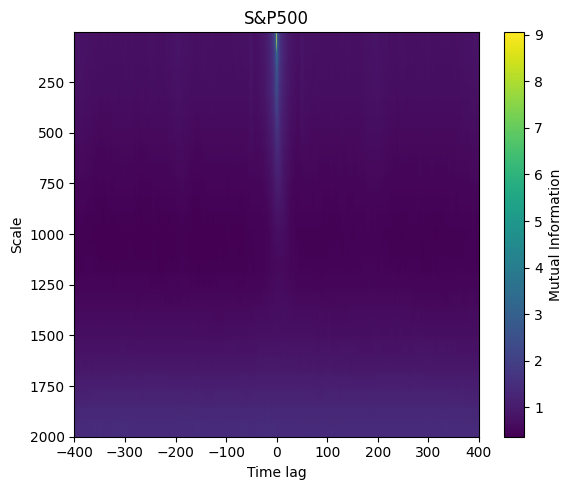

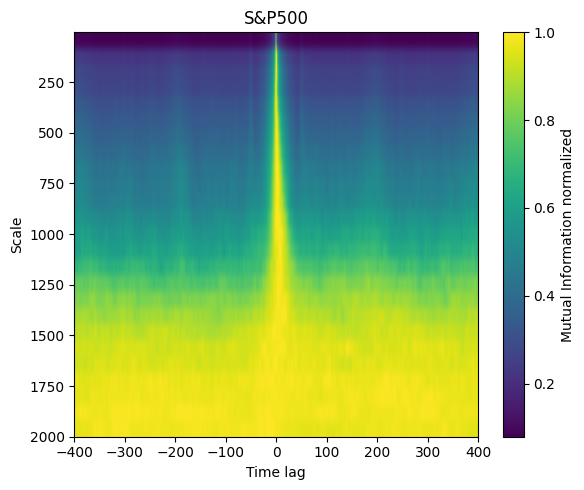

S&P500: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


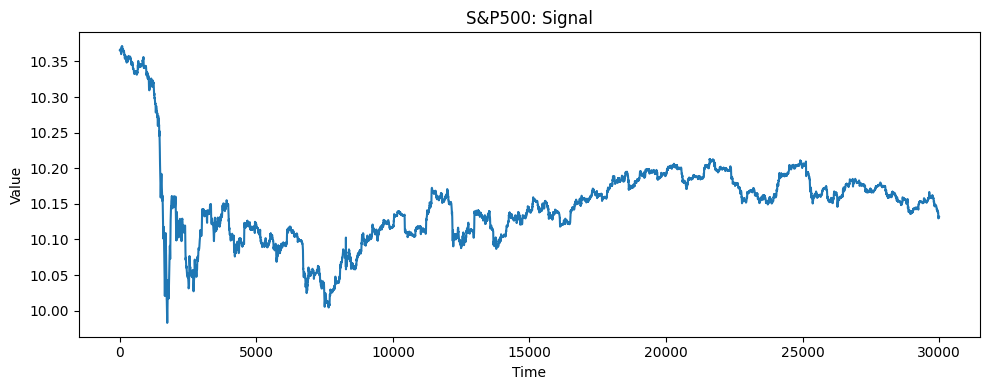

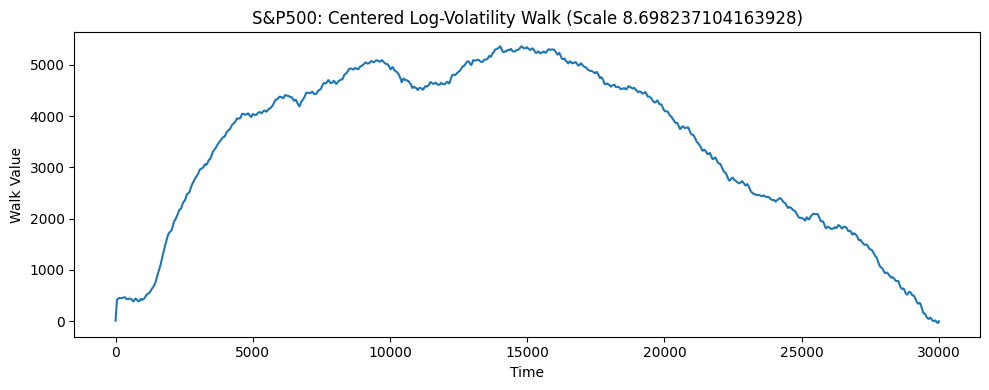

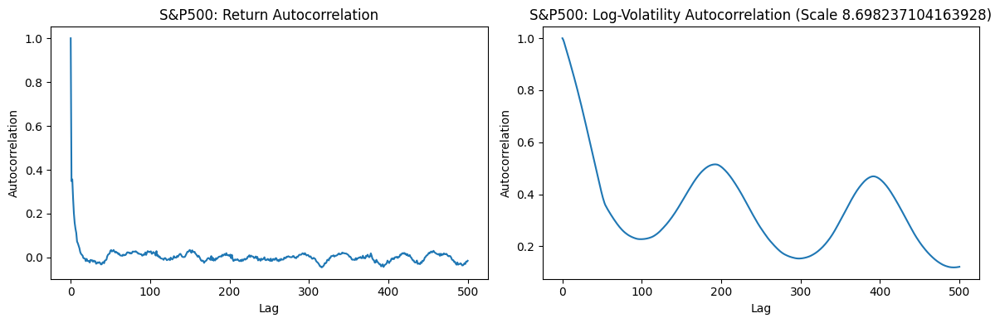

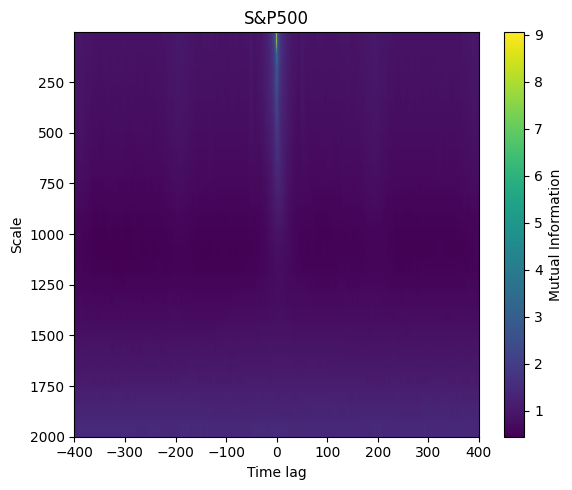

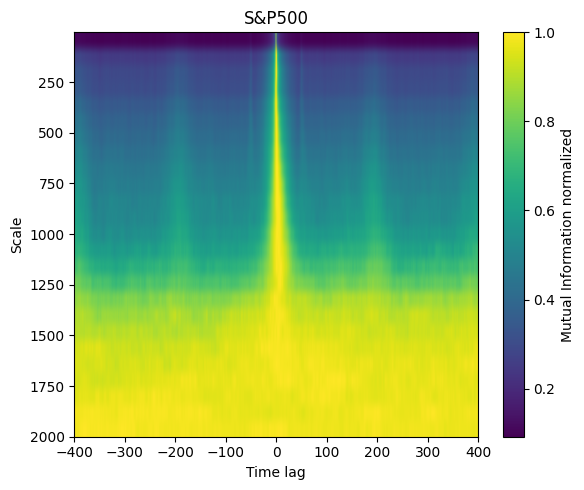

S&P500: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


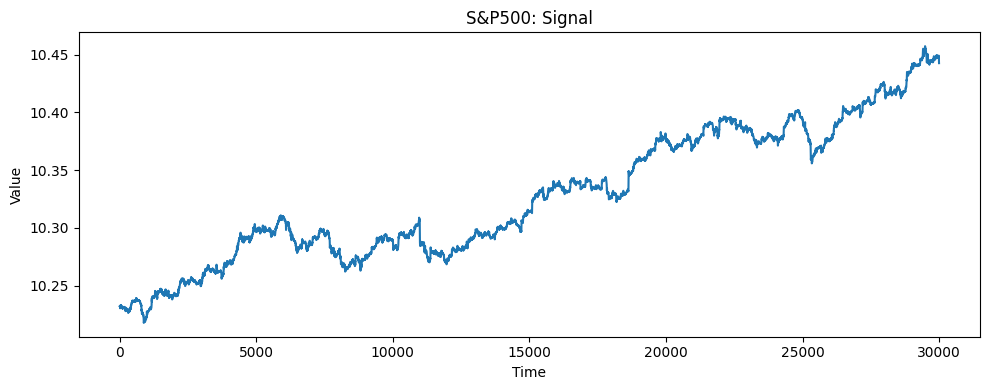

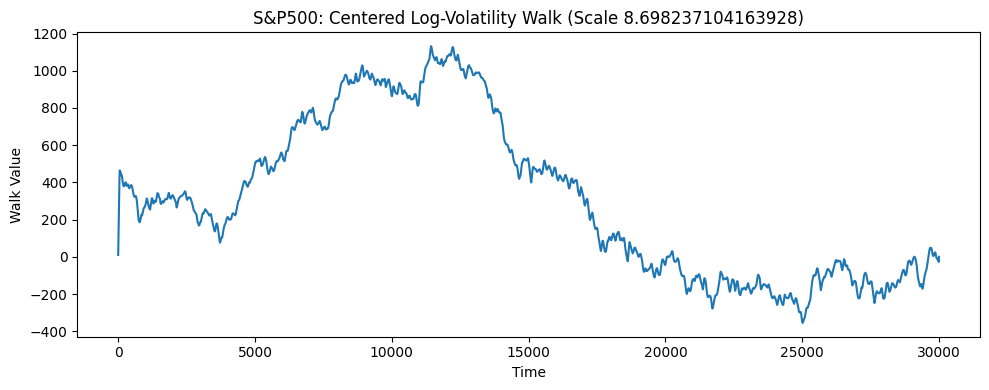

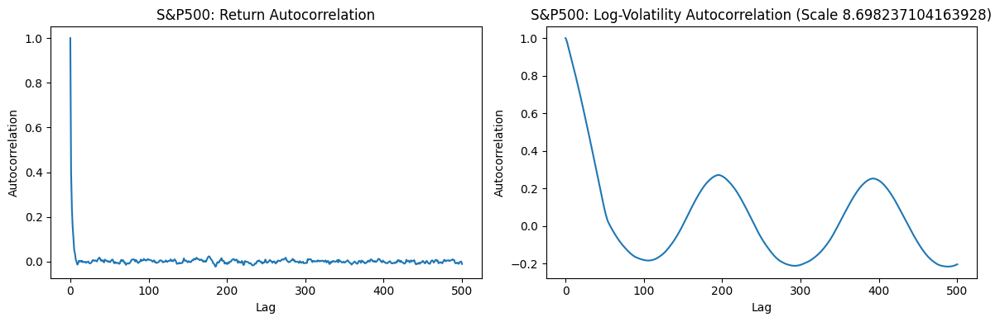

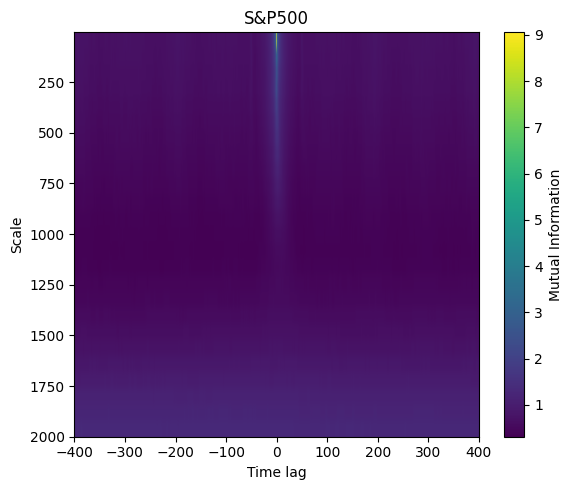

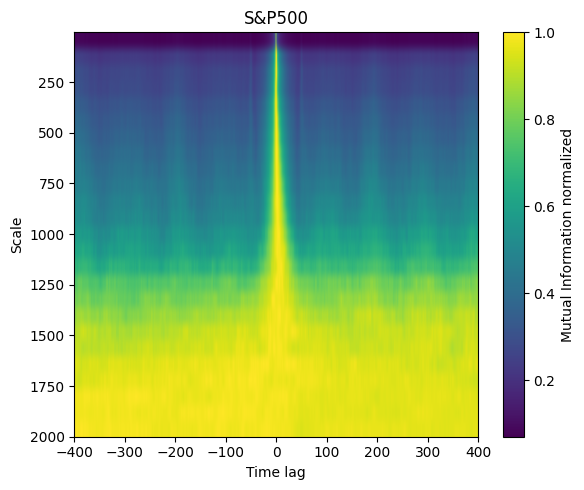

S&P500: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


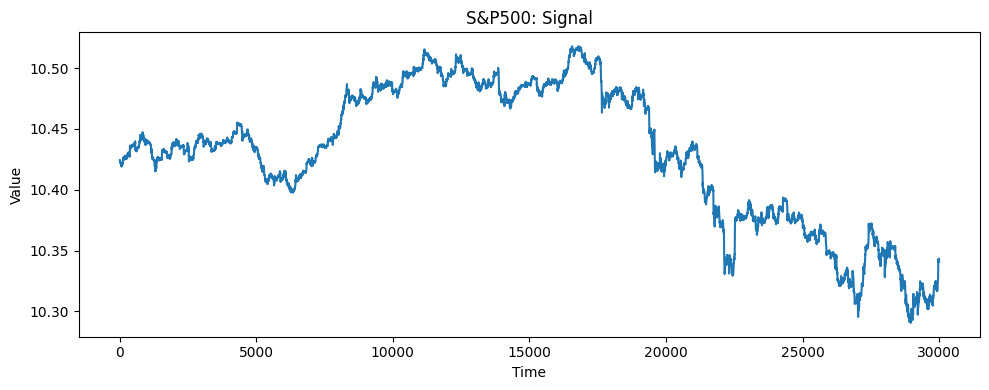

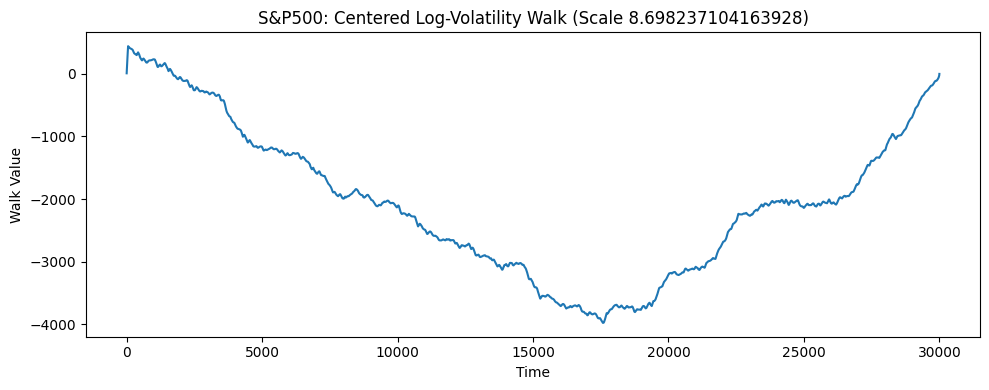

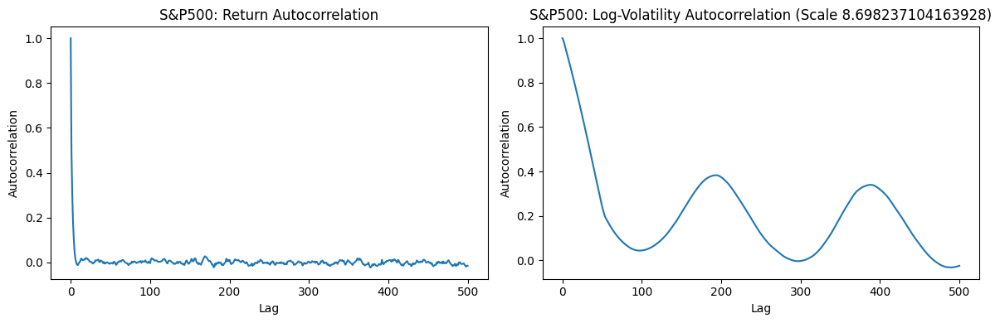

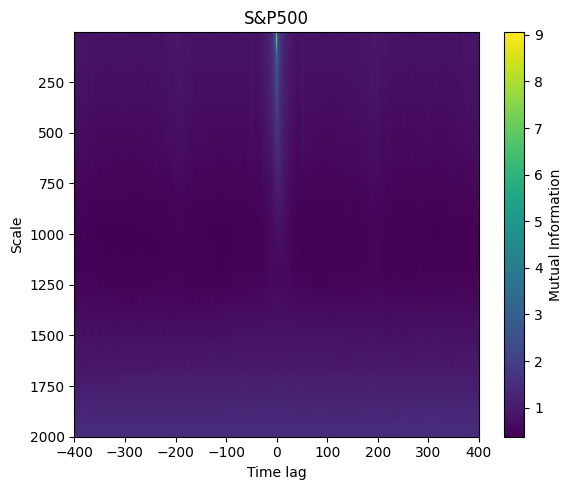

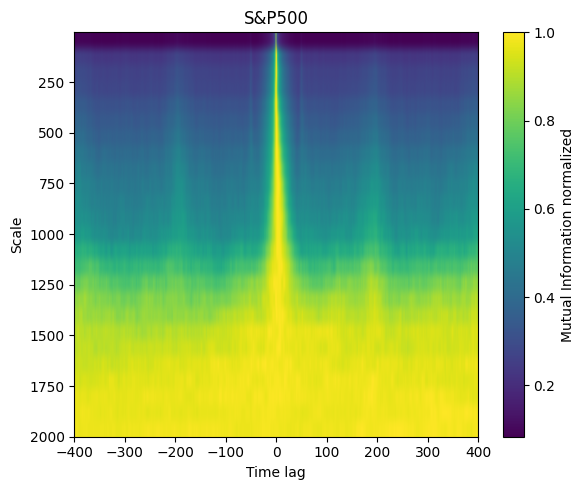

S&P500: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


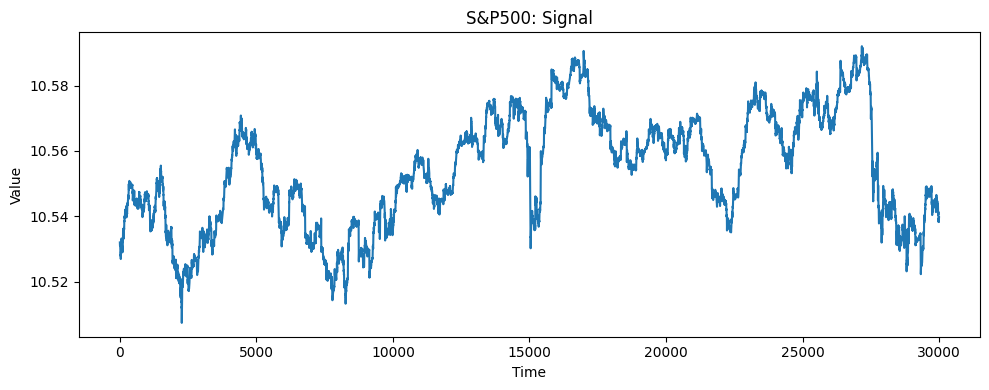

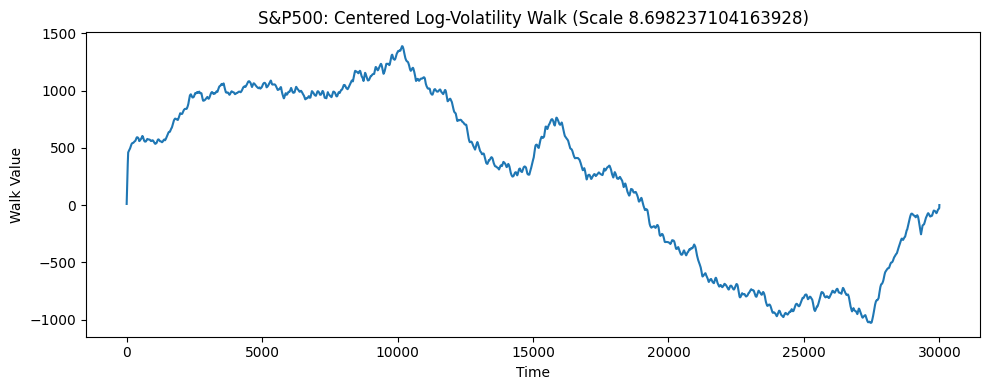

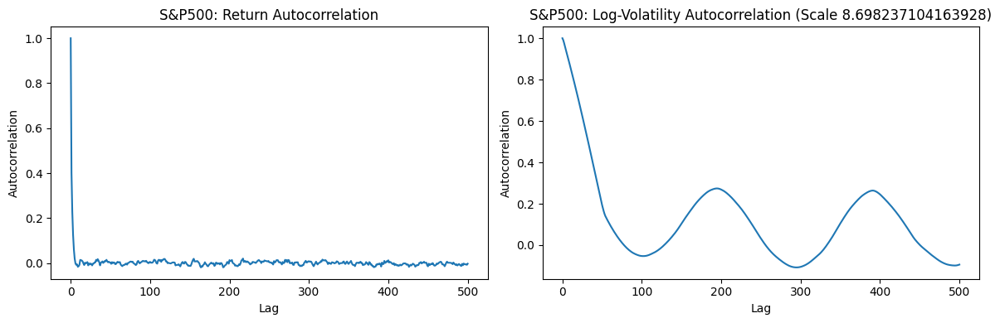

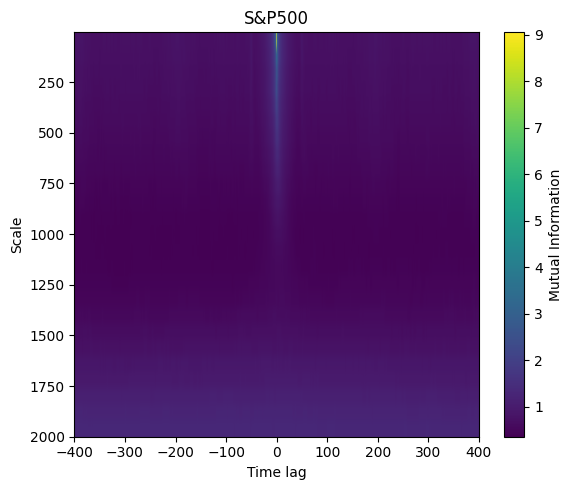

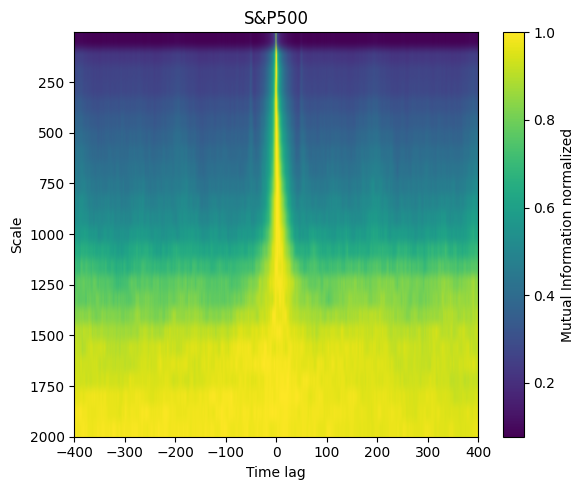

S&P500: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


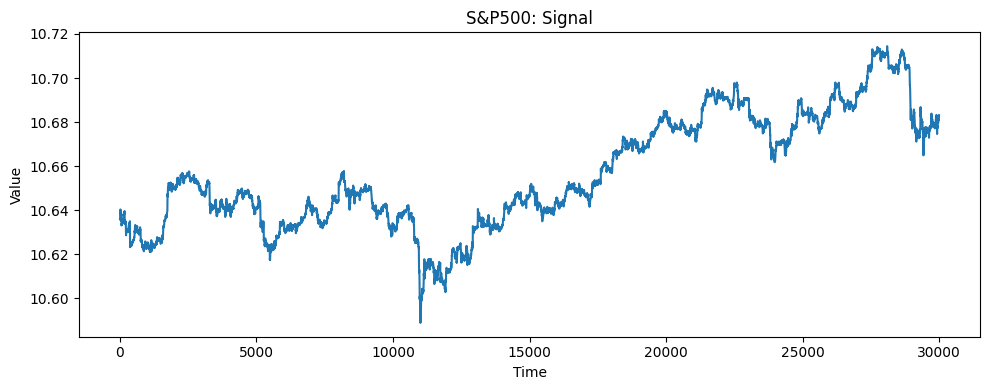

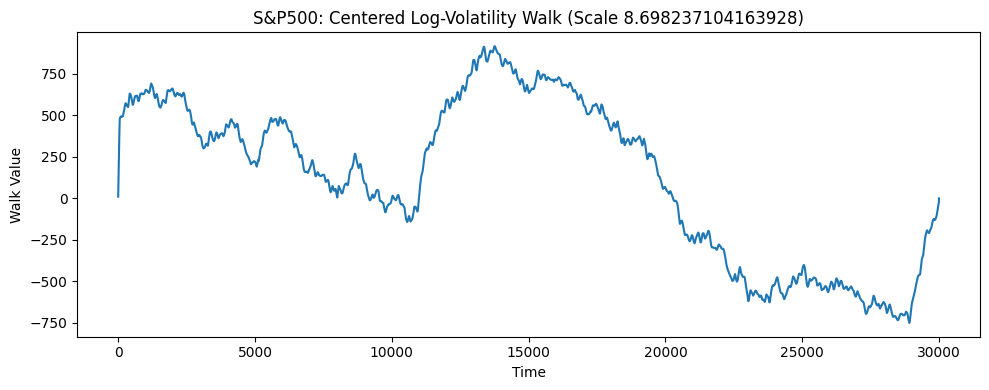

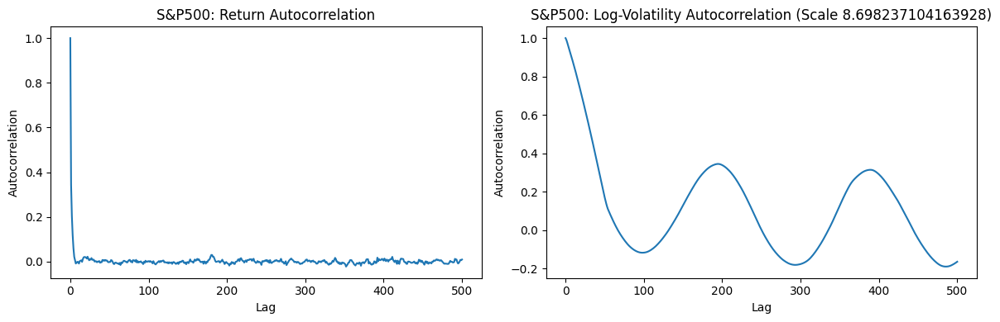

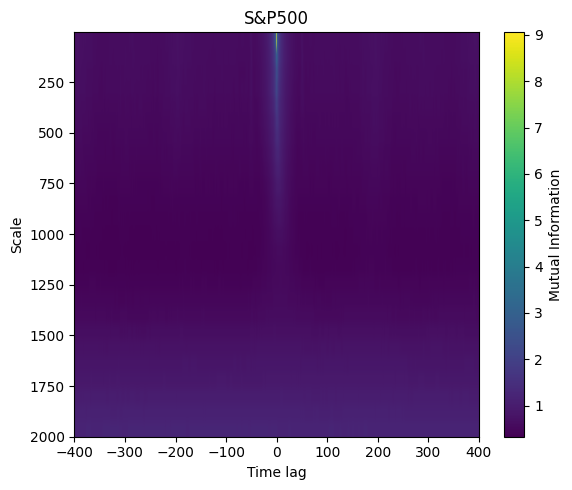

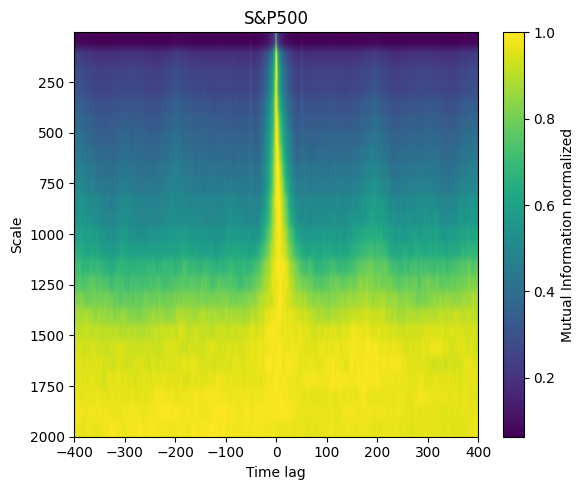

S&P500: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


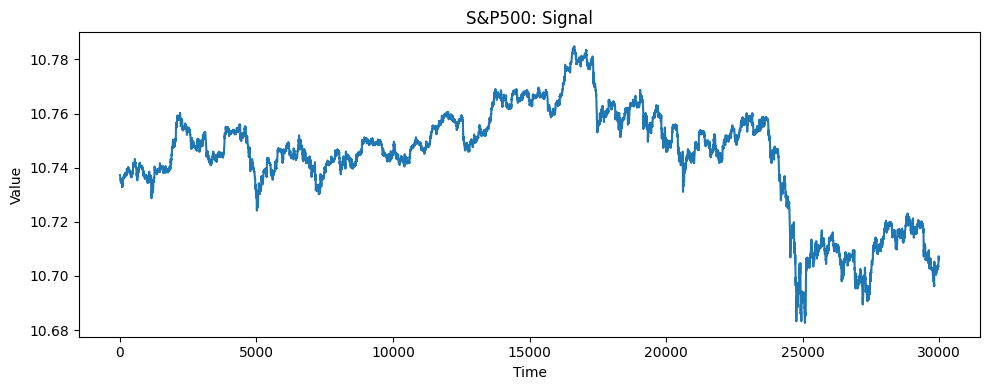

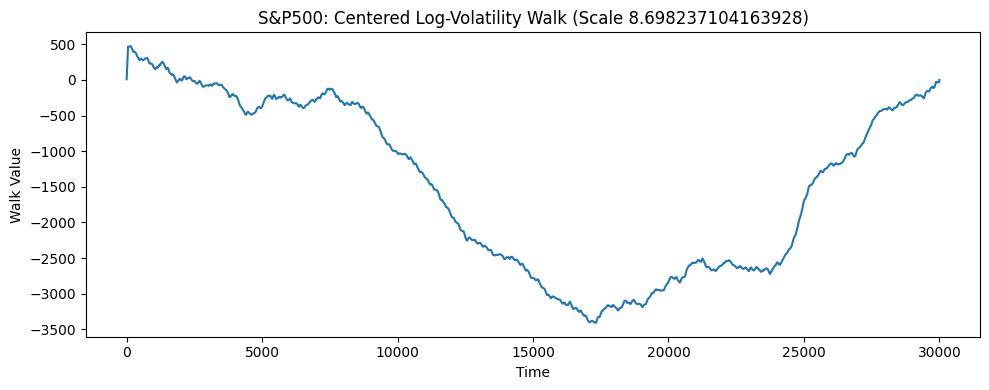

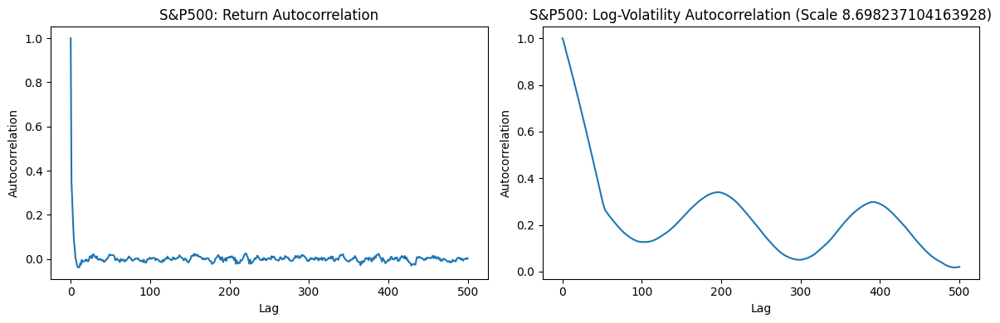

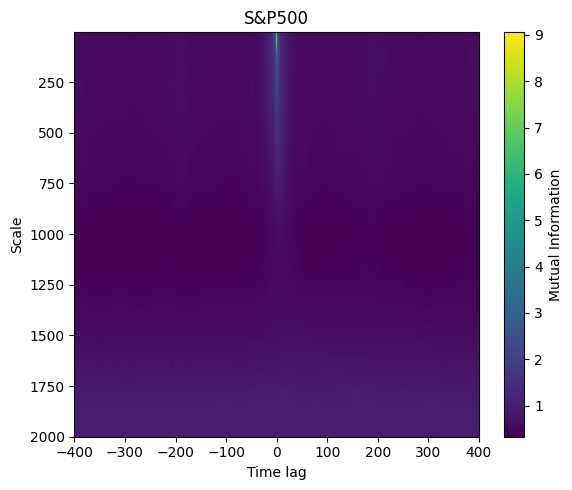

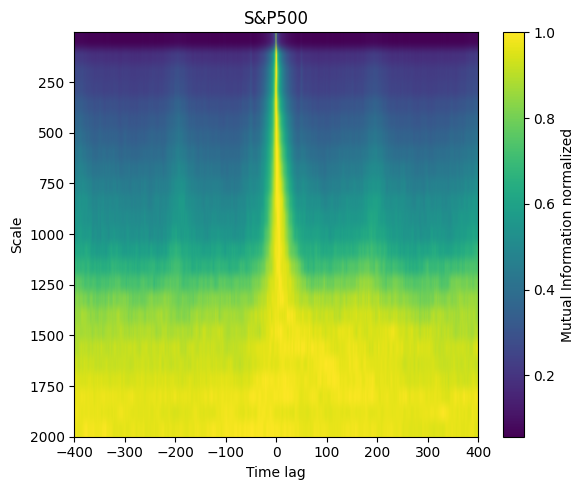

S&P500: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


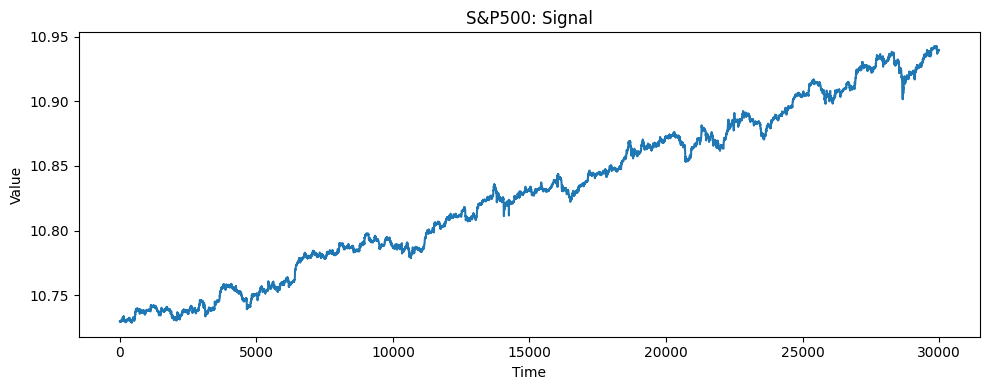

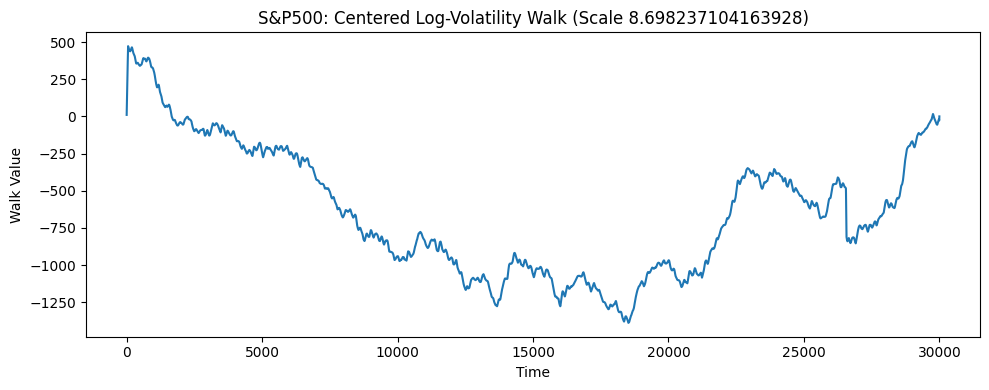

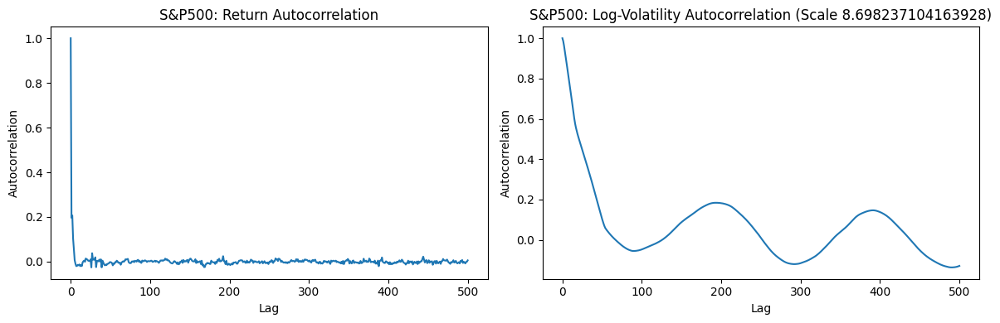

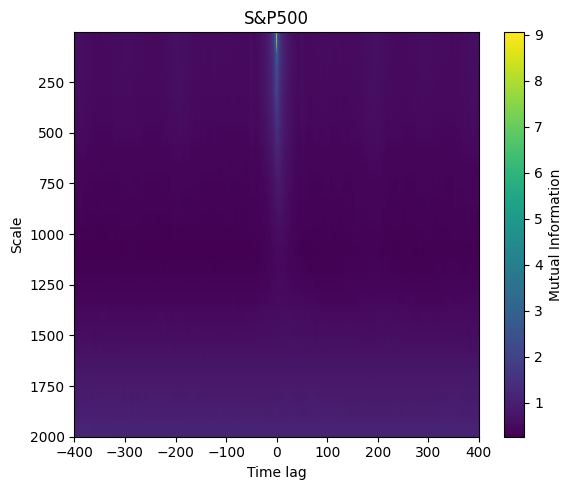

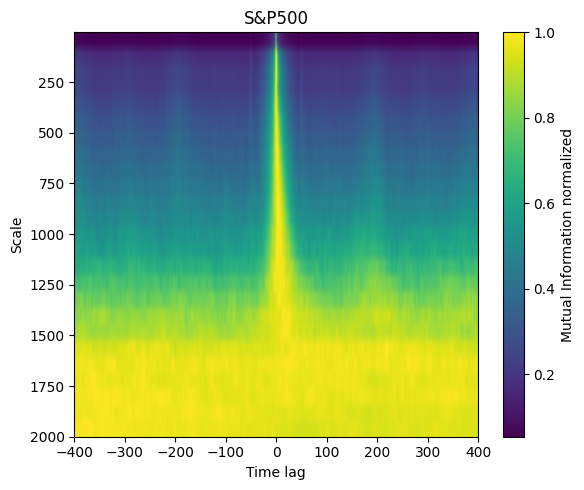

In [ ]:
SnP_results_batch = []
for i,window in enumerate(windows[::2]):
    if i==0:
        continue
    result_batch = analyse_SandP(df=window)
    np.save(f"mi_map_snp_{2*i*30000}-{(2*i+1)*30000}.npy",result_batch)
    SnP_results_batch.append(result_batch)

In [ ]:
np.save("mi_map_snp_all.npy",SnP_results_batch)

## BTC
data length 30000

In [ ]:
DATA_DIR_BTC = 'bitstamp-btcusd-minute-data/data'
df_hist_btc = pd.read_csv(
    f'{DATA_DIR_BTC}/historical/btcusd_bitstamp_1min_2012-2025.csv',
)

6846600


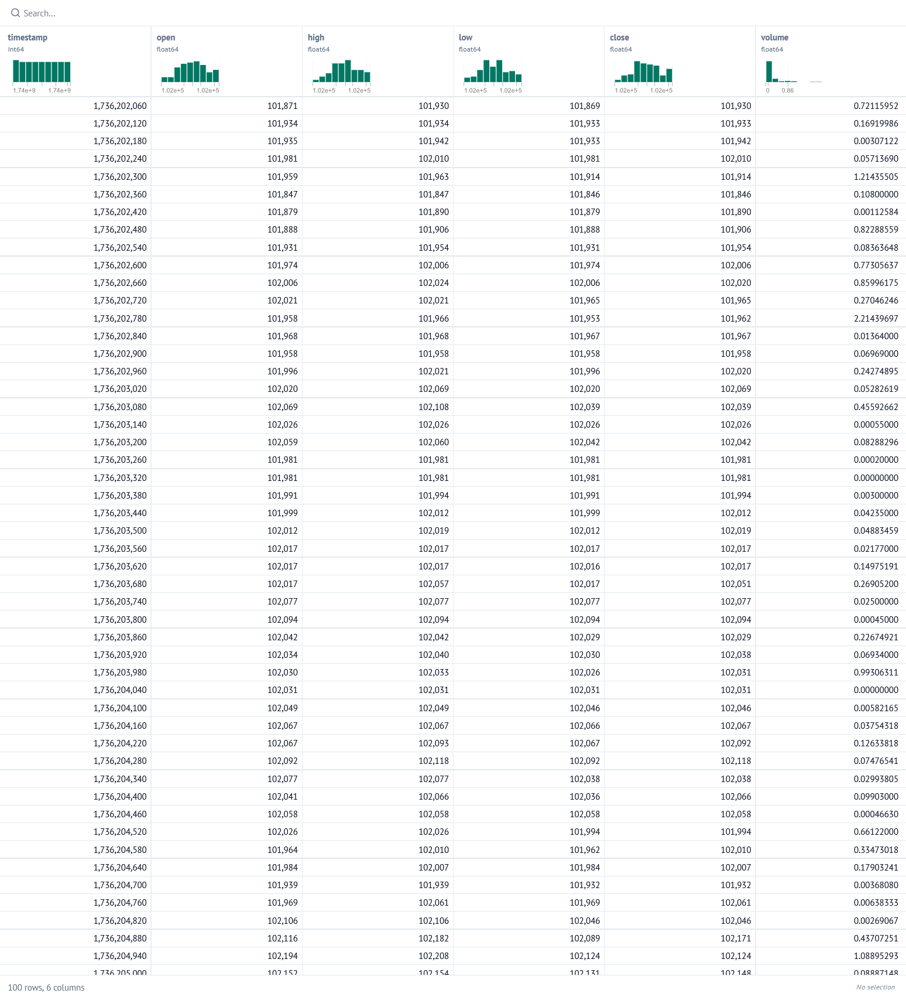

In [ ]:
print(len(df_hist_btc))
df_hist_btc.tail(100)

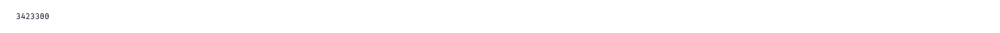

In [ ]:
len(df_hist_btc[::2])

In [ ]:
def analyze_btc(df):
    n_samples = 30000
    #take every 2nd sample to have a same sampling as sandp
    log_price = np.array(df["open"].values)
    scales = np.logspace(np.log10(4), np.log10(2000), 25)
    signals = {
        # I put -n_samples: instead of :n_samples as before because the beginning of the btc signal might be not very representative
        'BTC': np.log(log_price[:n_samples])
    }
    results = compare_signals(signals, scales=scales, wavelet=psi_haar_smooth, max_level=8, window=50, ref_idx=0, max_time_lag=400, use_parallel=True, n_jobs=8)

    for name, output in results.items():
        print(f"{name}: log_vol_series shape = {output['log_vol_series'].shape}, mi_map shape = {output['mi_map'].shape}")
    plot_signals(results)
    plot_volatility_walks(results, scale_idx=3)
    plot_autocorrelations(results, scale_idx=3, max_lag=500)
    plot_mi_maps(results, max_time_lag=400)

    return results


In [ ]:
results_btc = analyze_btc()

BTC batches
10 batches 30000 samples

14


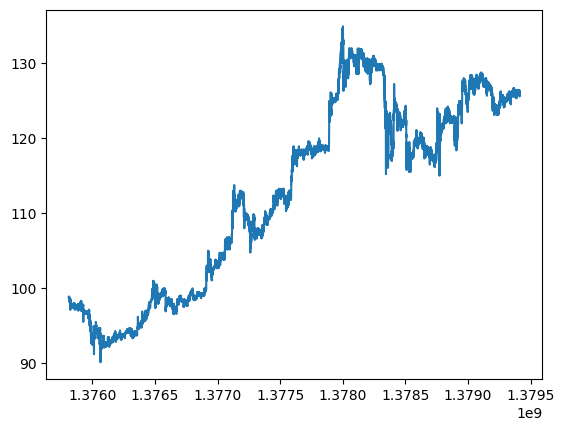

24


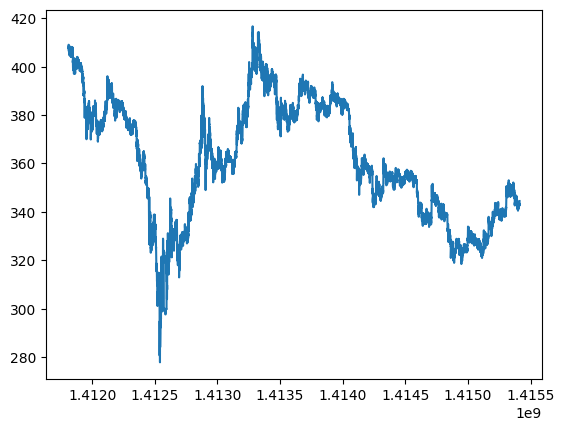

34


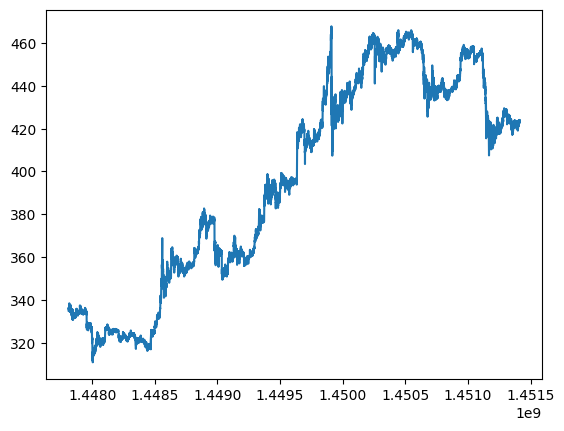

44


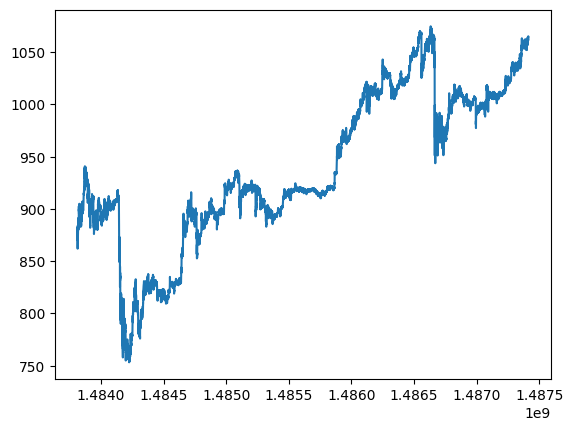

54


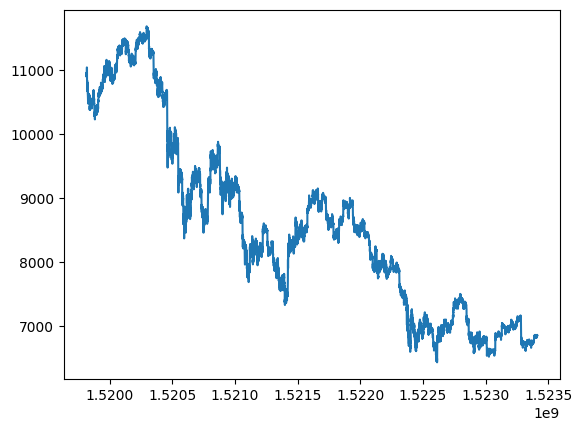

64


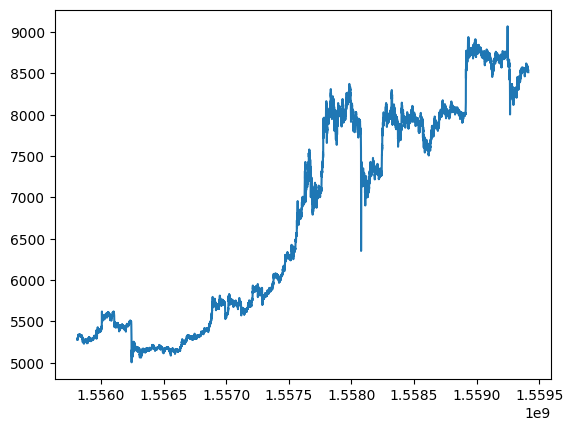

74


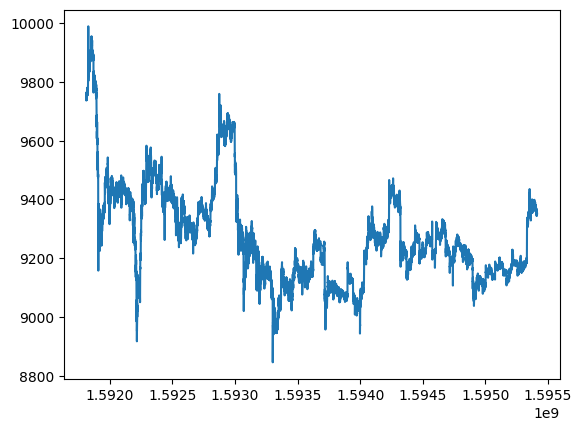

84


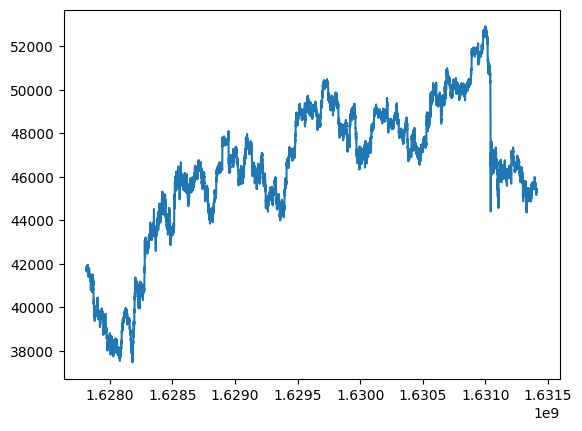

94


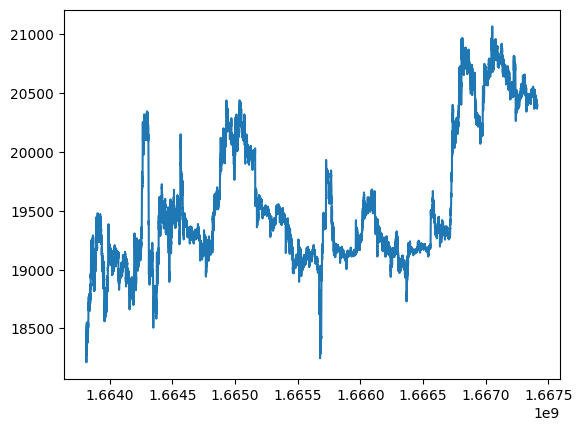

104


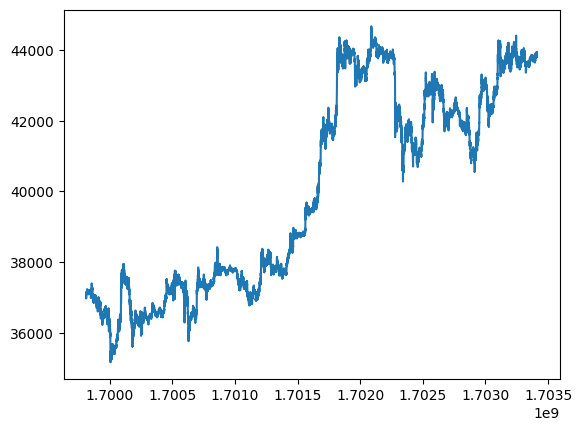

In [ ]:
num_windows_btc = 114
df_btc_2m=df_hist_btc[::2]
windows_btc = [
    df_btc_2m.iloc[i*window_size : (i+1)*window_size].reset_index(drop=True)
    for i in range(num_windows_btc)
]

for i_btc,w_btc in enumerate(windows_btc[14::10]):
    print(14+i_btc*10)
    plt.plot(w_btc["timestamp"],w_btc["open"])
    plt.show()

BTC: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


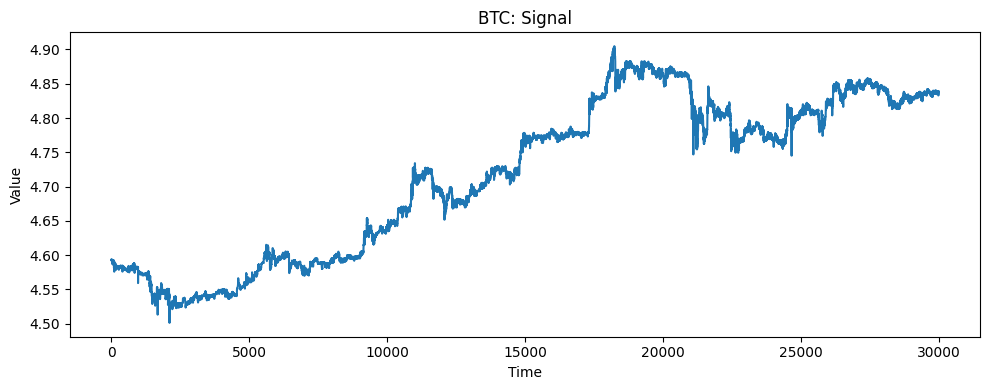

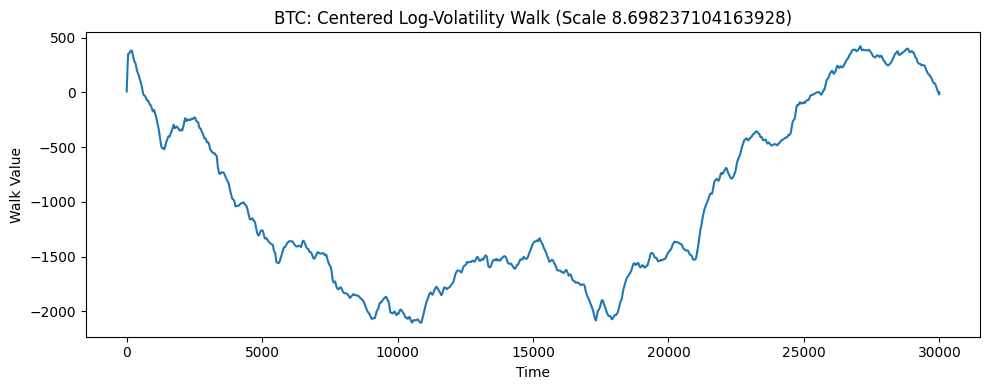

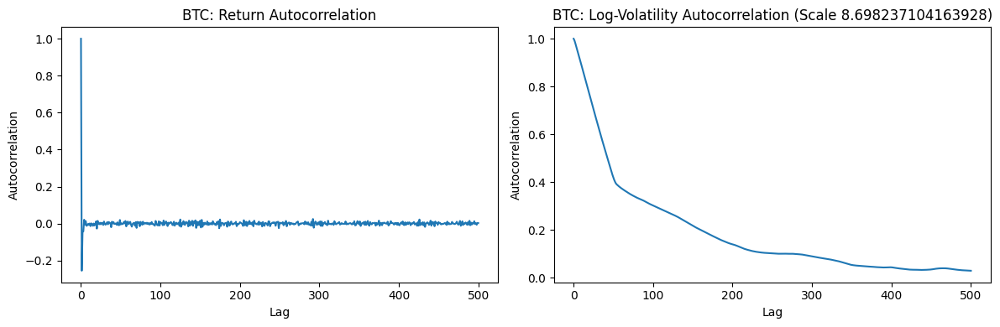

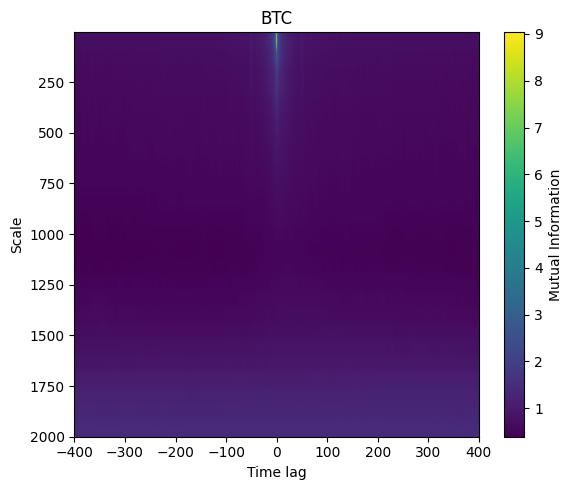

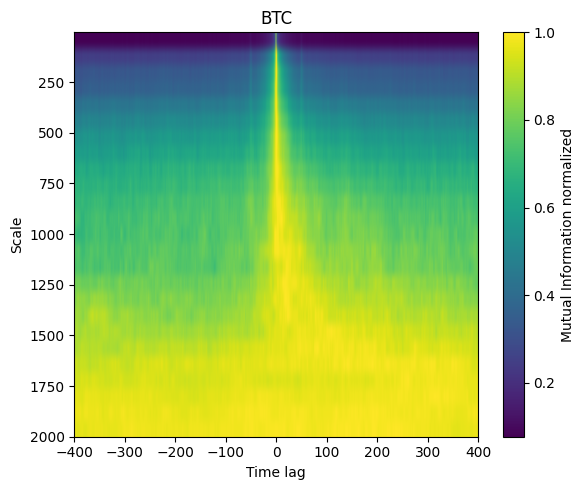

BTC: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


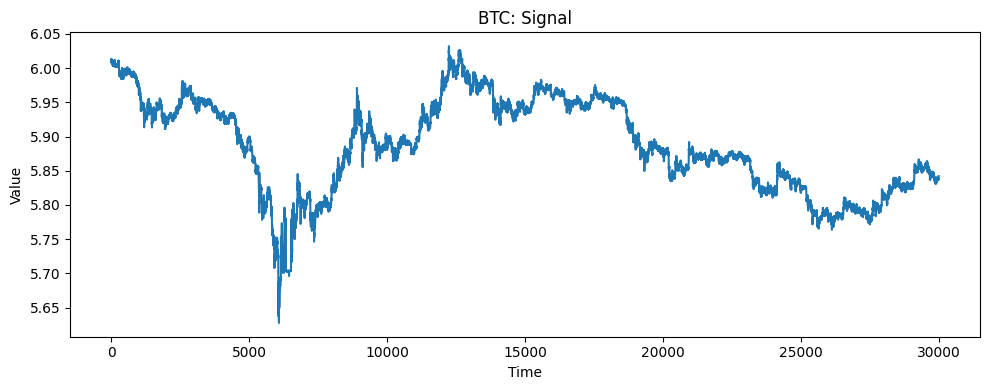

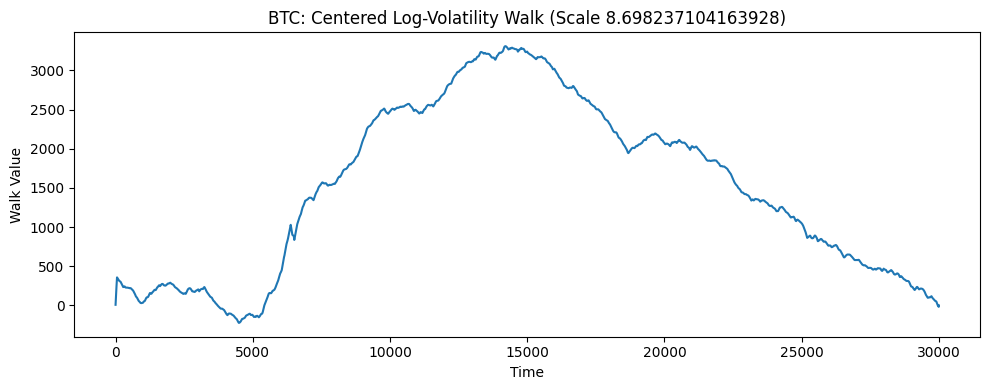

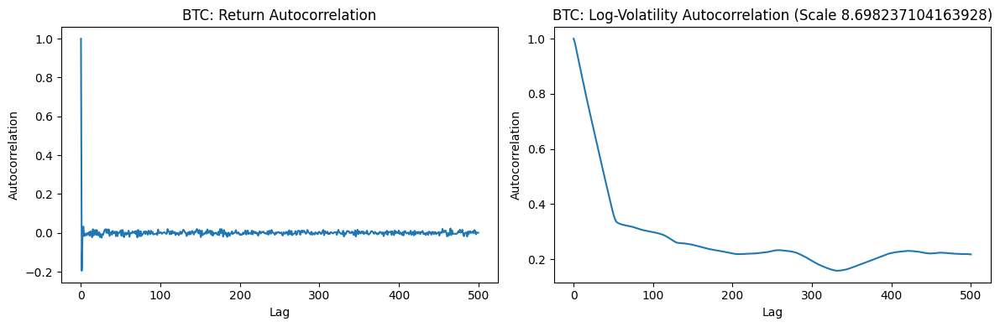

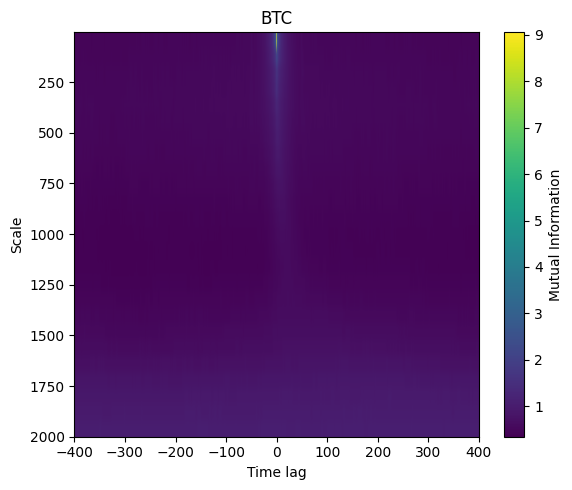

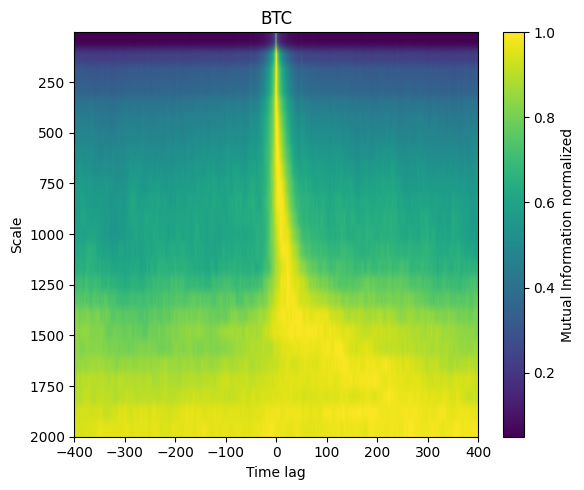

BTC: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


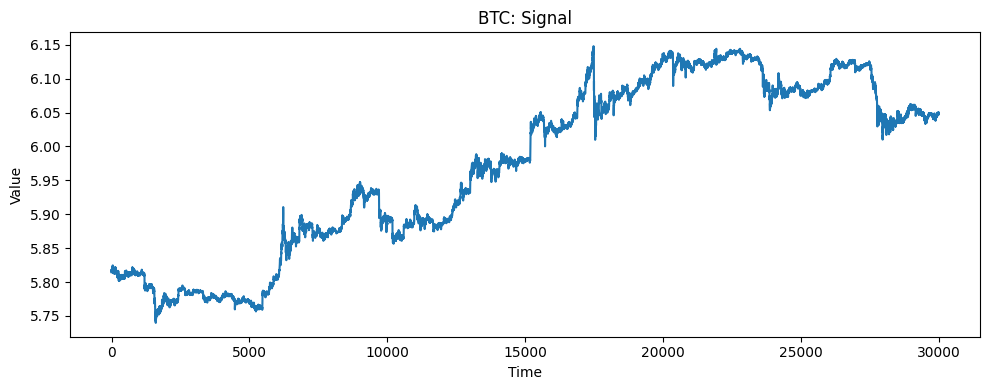

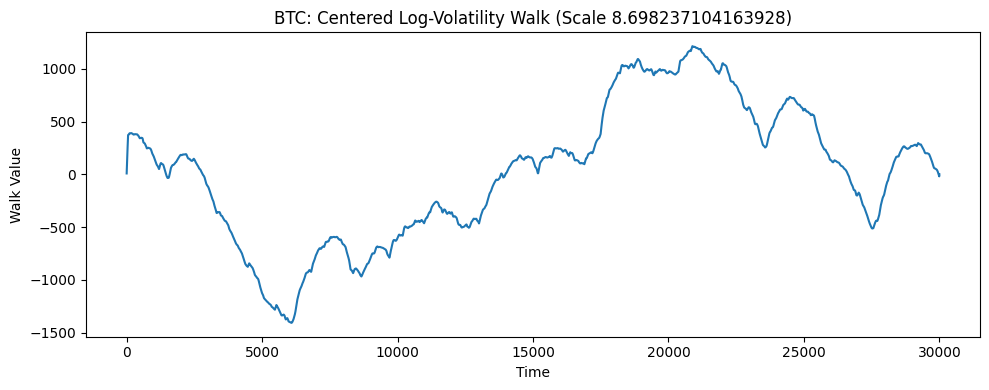

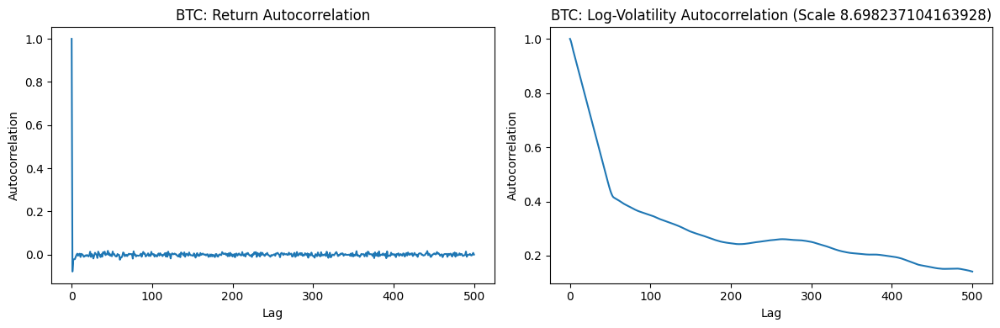

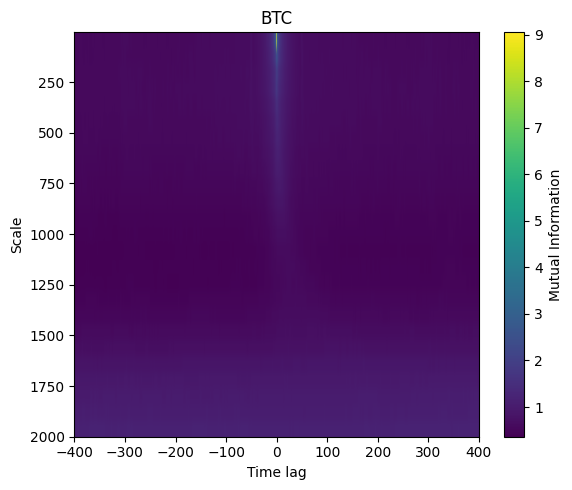

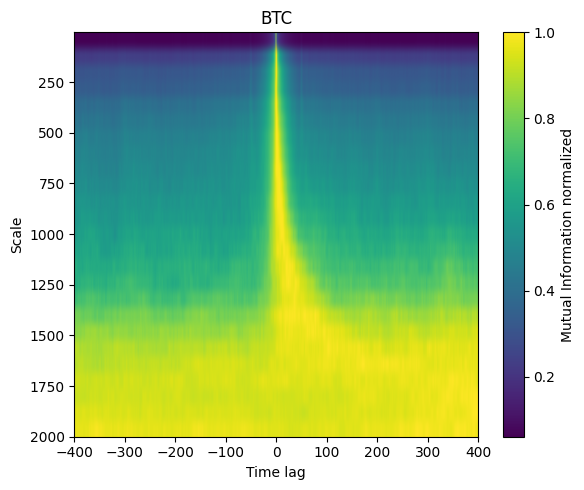

BTC: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


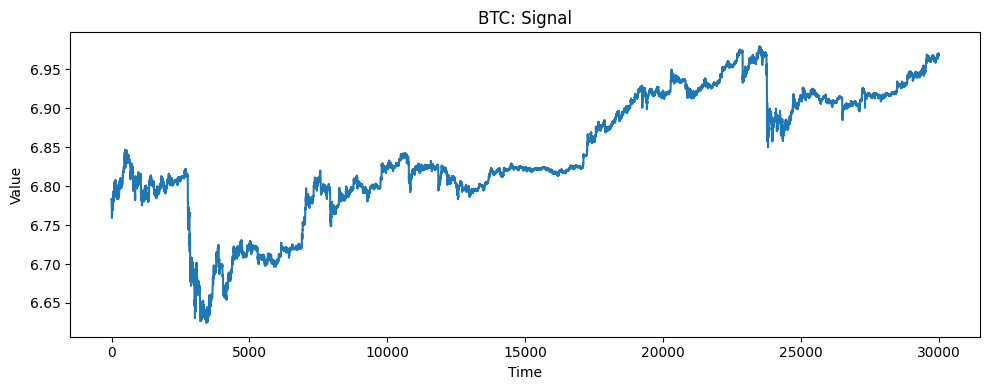

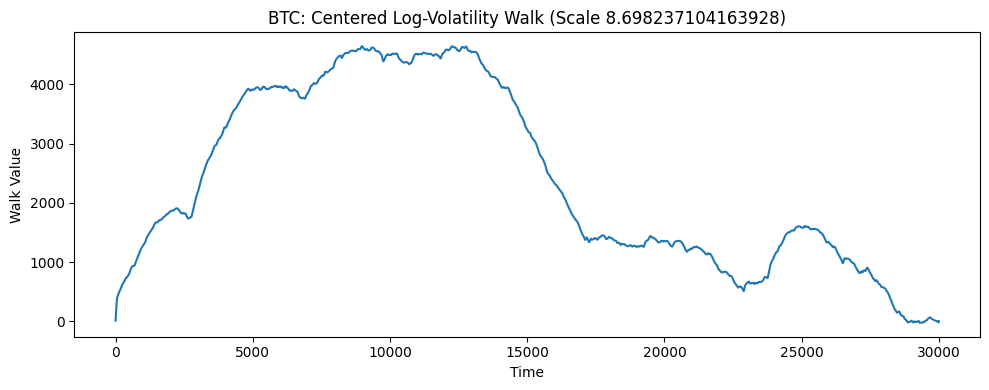

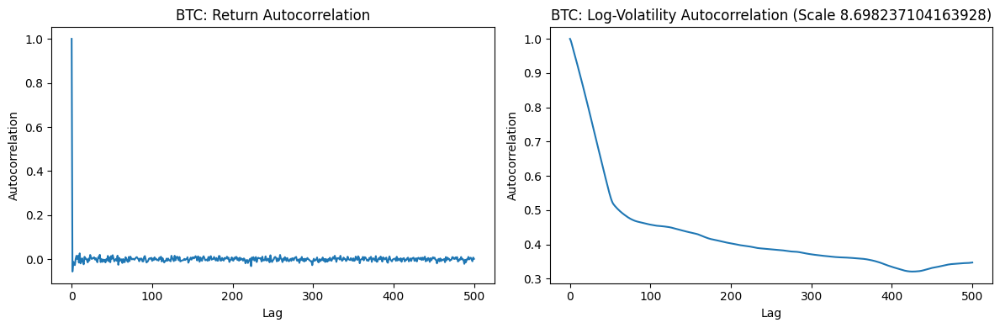

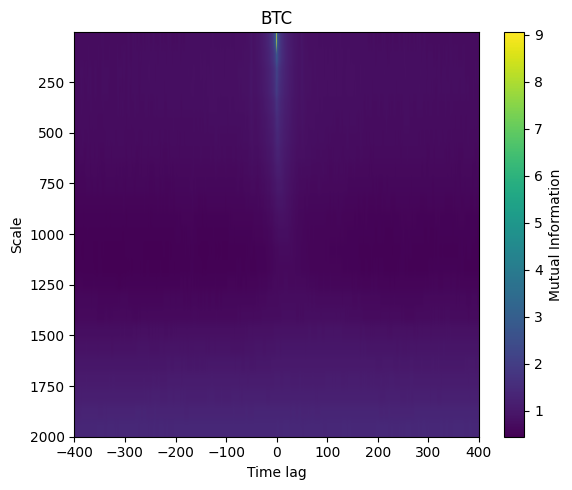

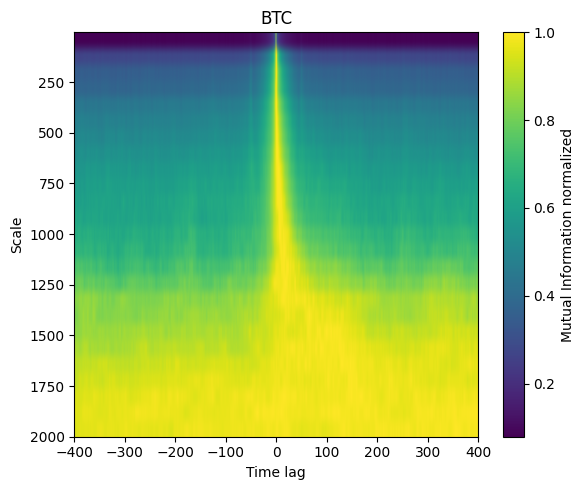

BTC: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


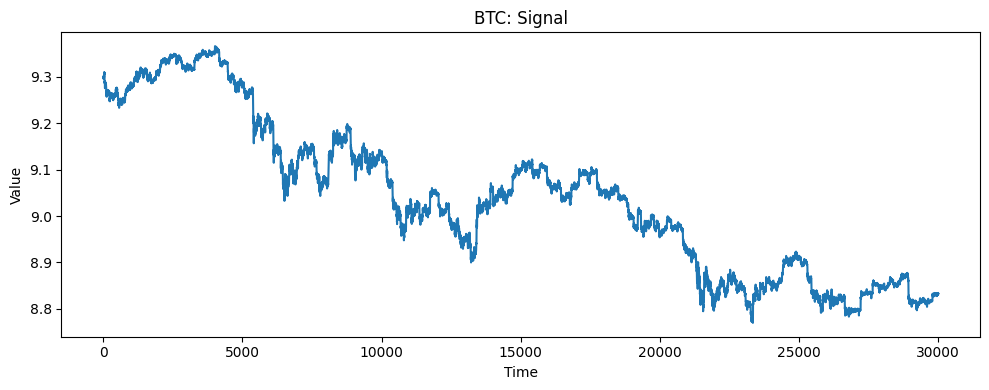

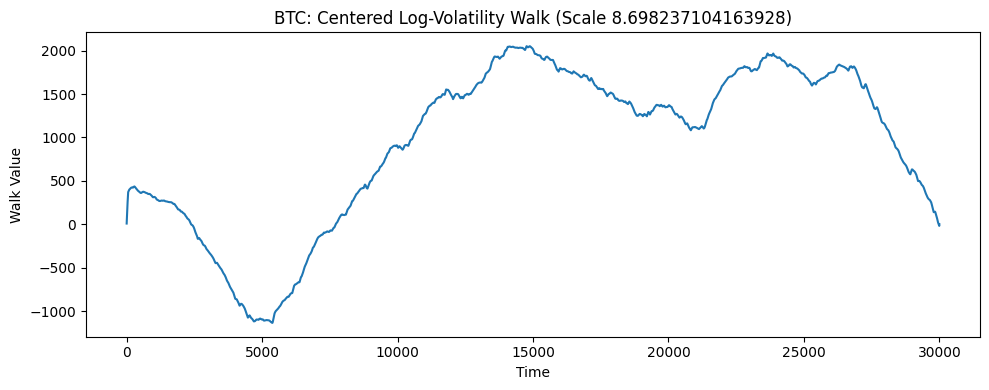

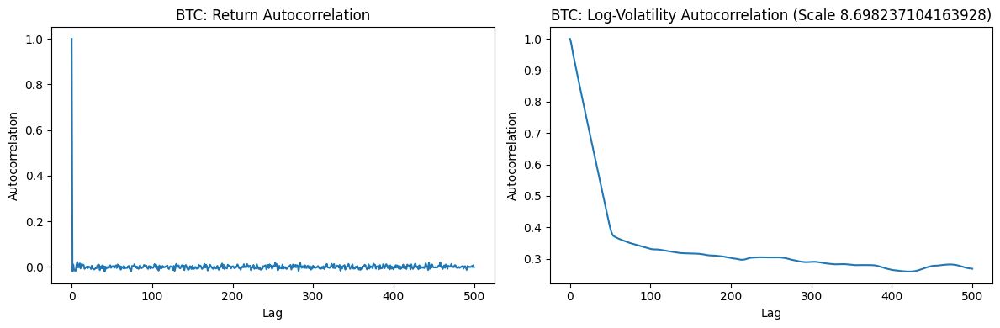

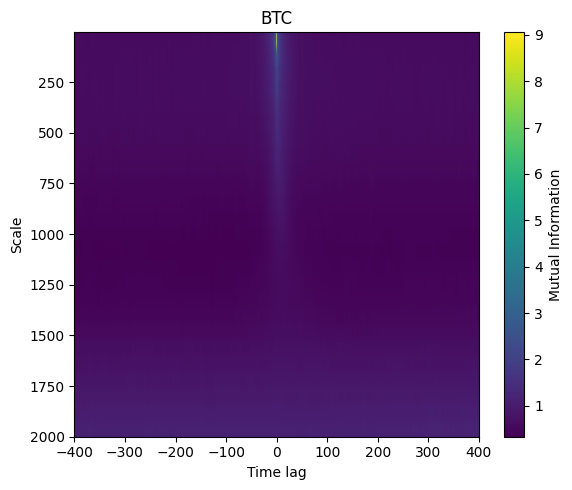

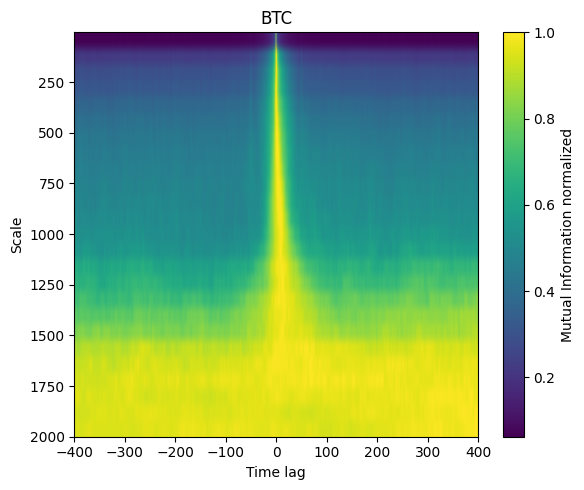

BTC: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


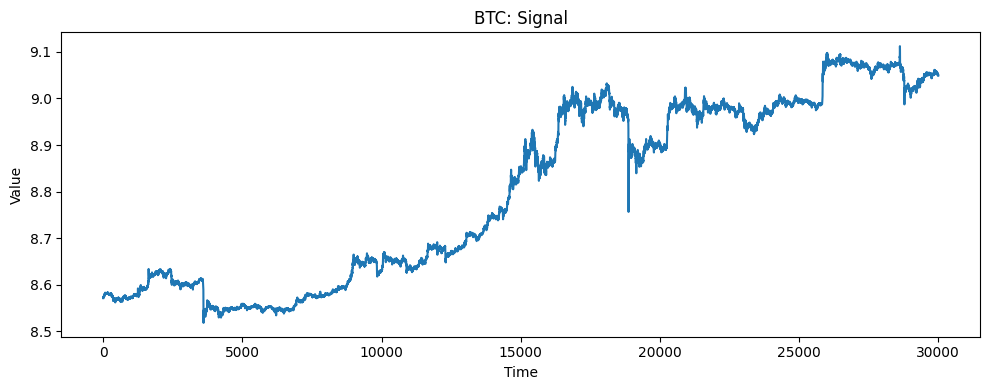

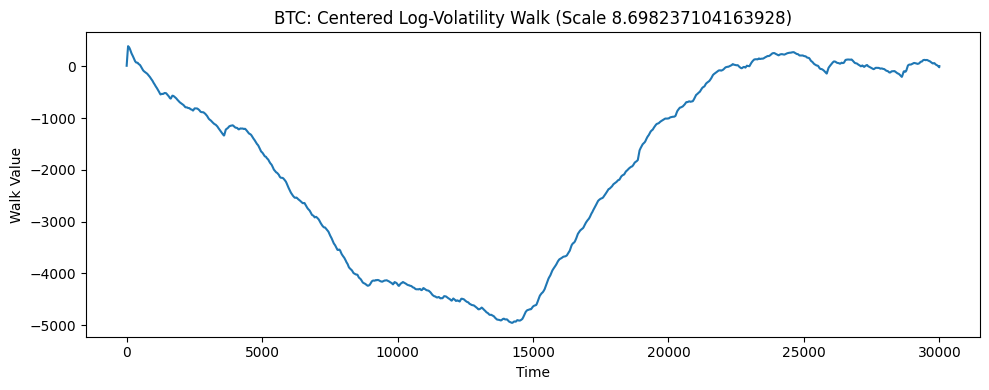

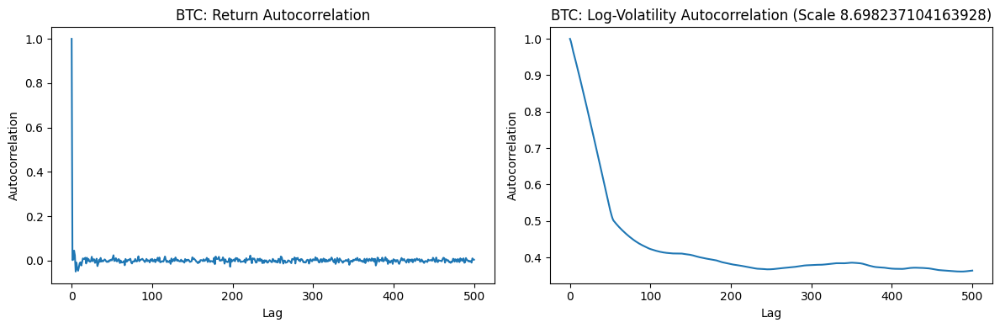

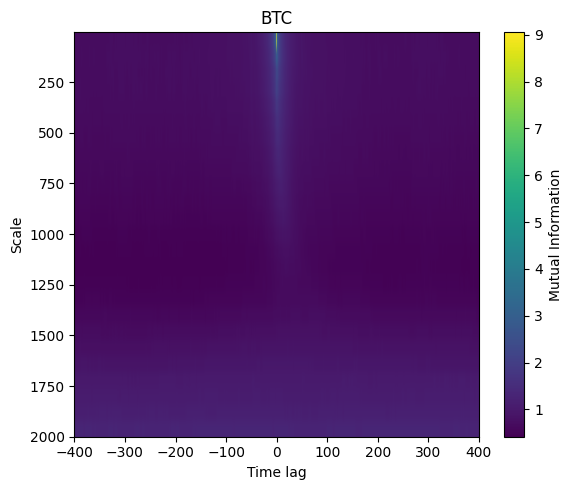

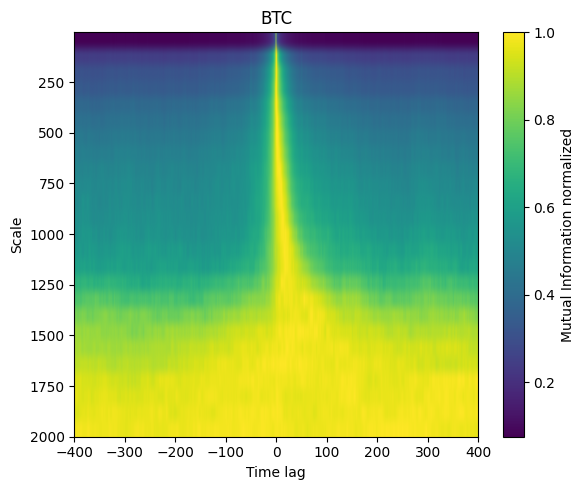

BTC: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


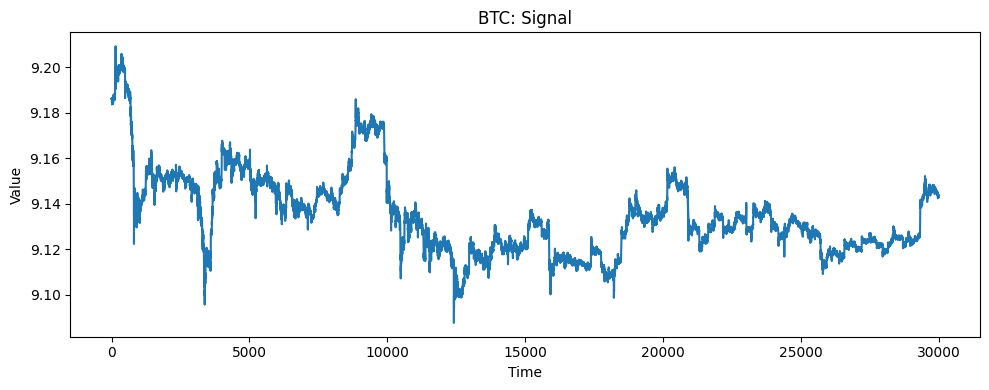

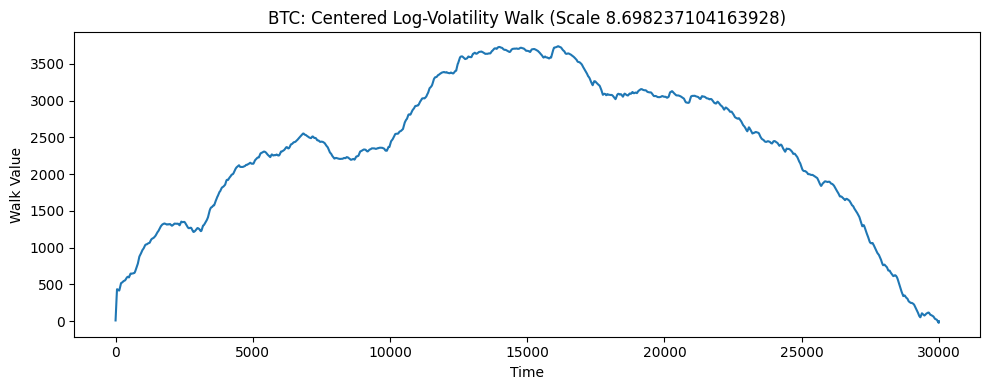

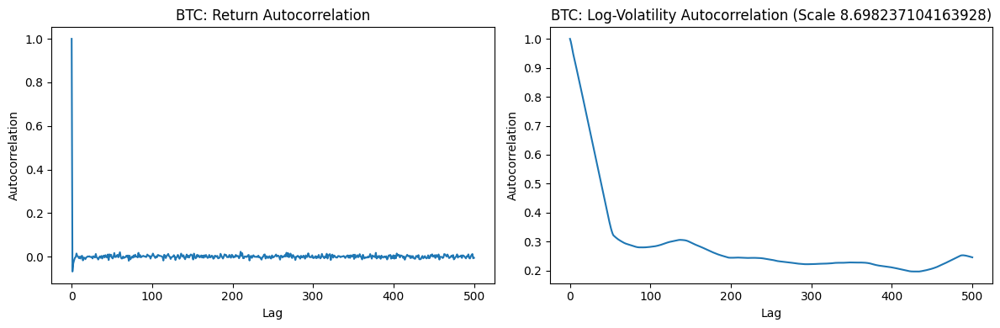

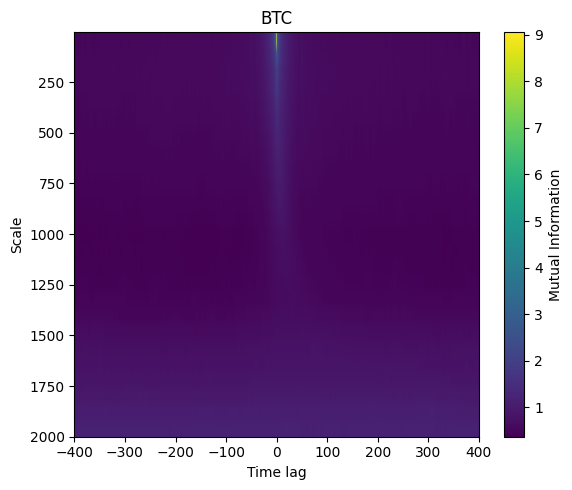

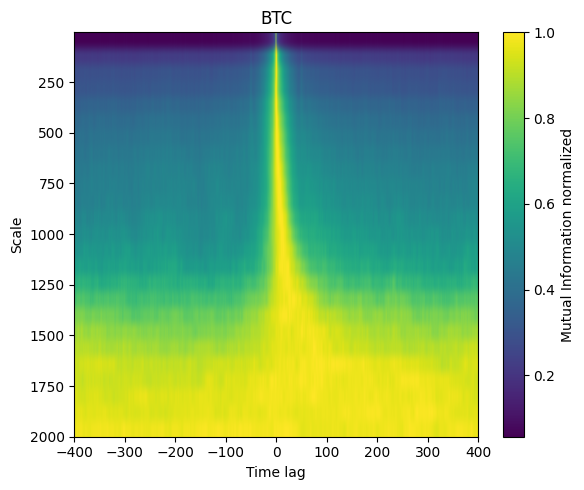

BTC: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


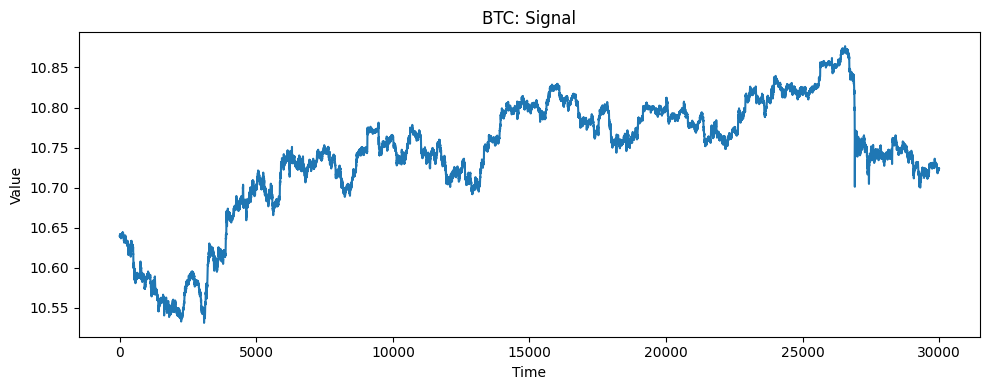

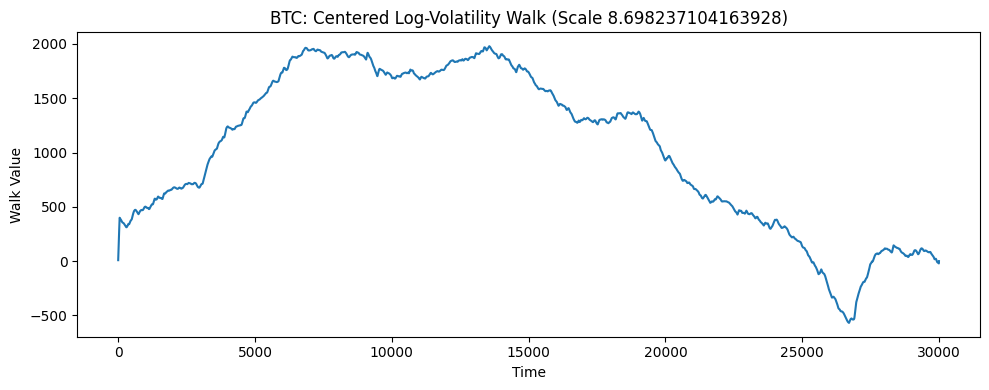

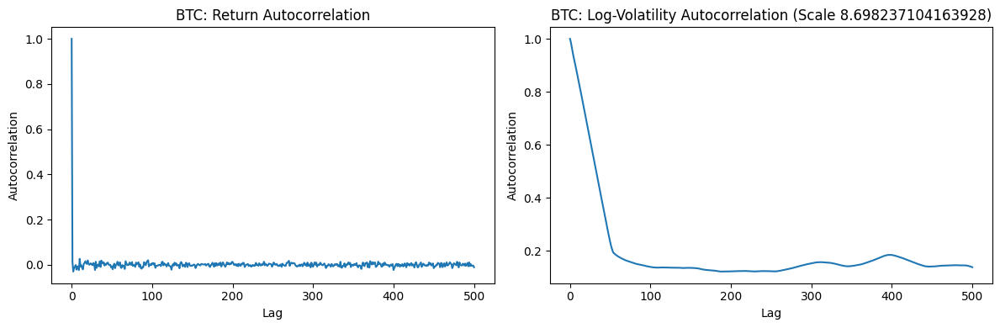

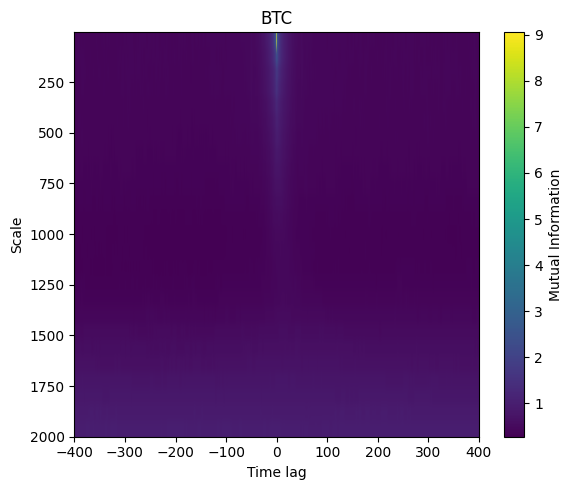

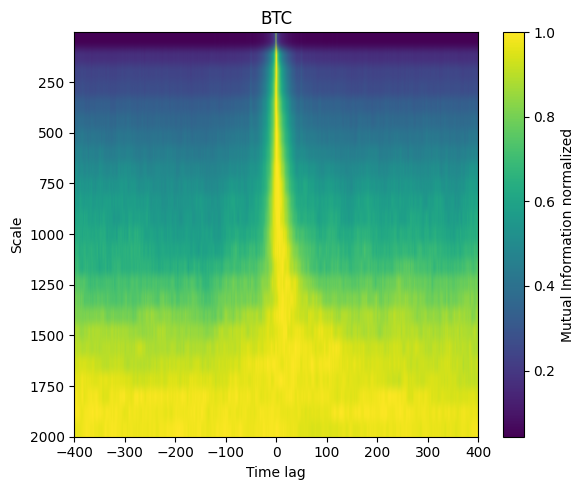

BTC: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


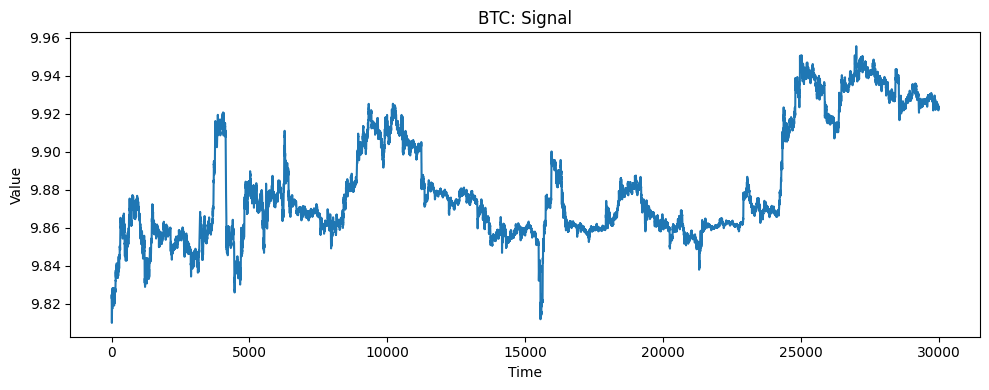

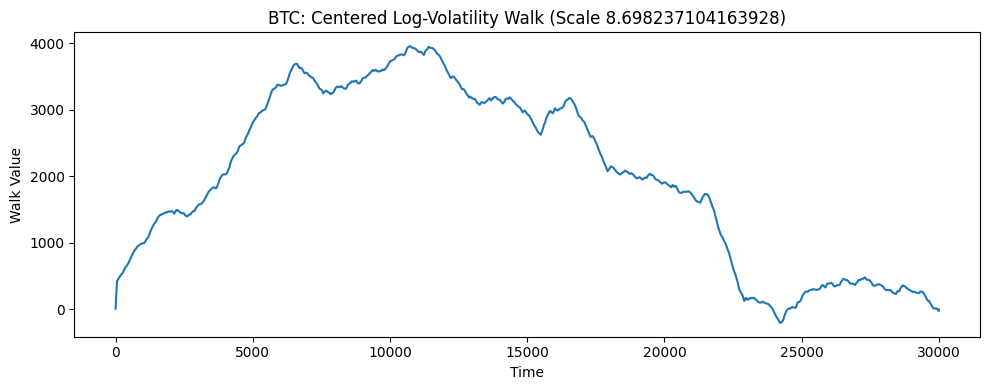

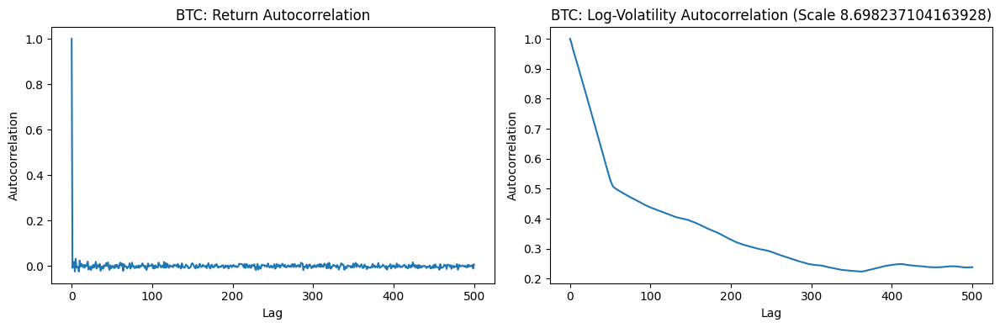

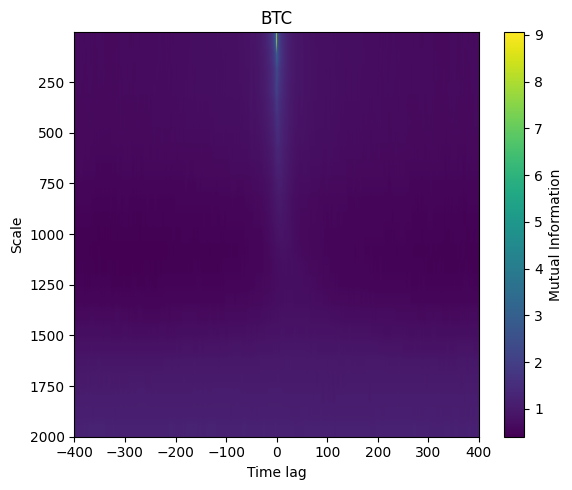

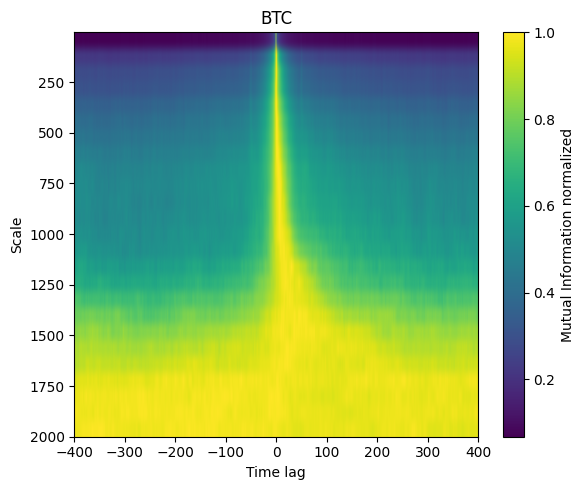

BTC: log_vol_series shape = (25, 30000), mi_map shape = (25, 801)


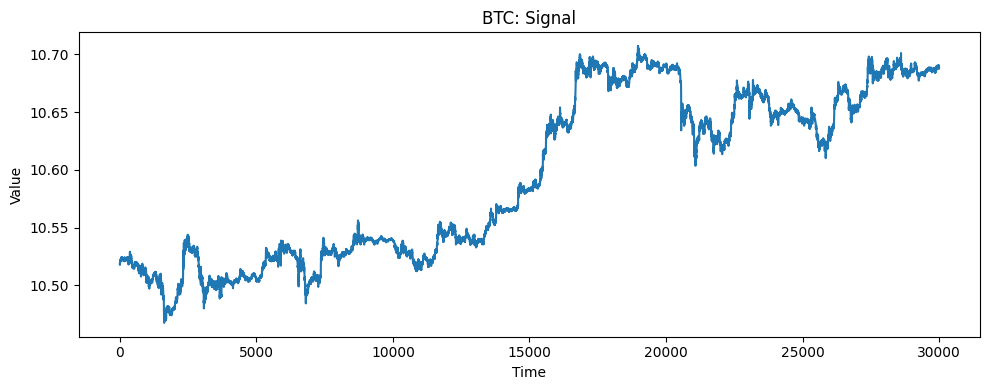

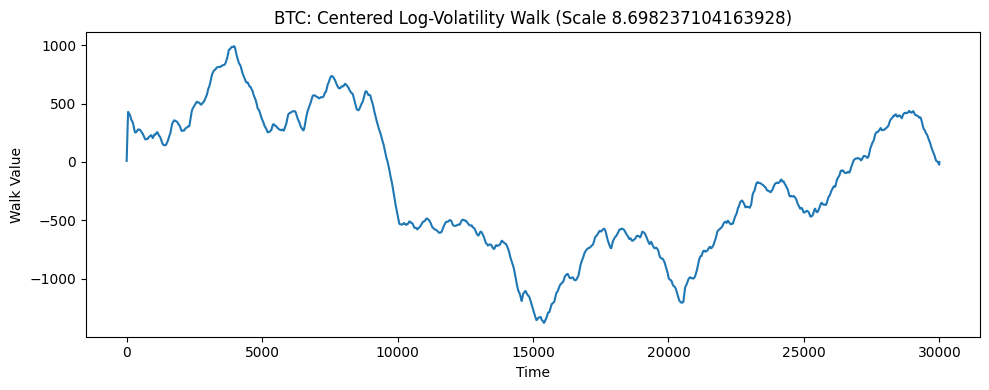

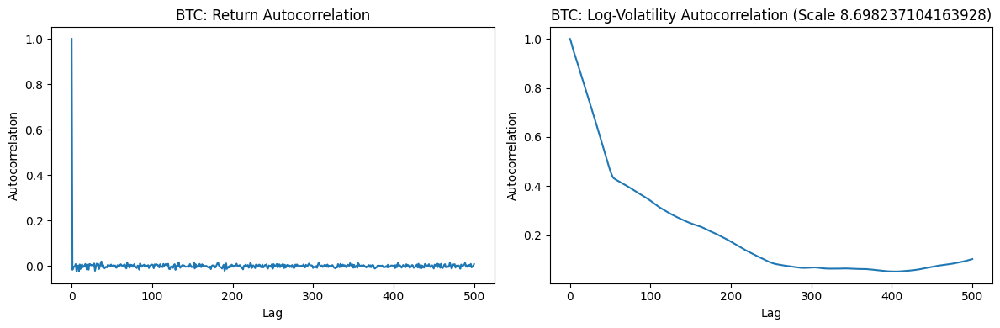

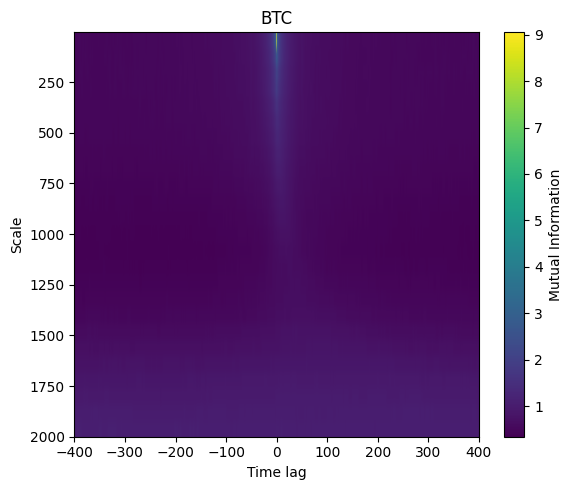

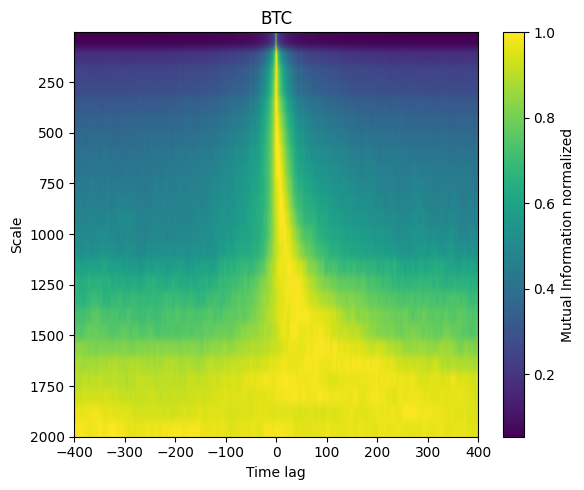

In [ ]:
BTC_results_batch = []
for i_btc_batch,window_btc in enumerate(windows_btc[14::10]):
    result_batch_btc = analyze_btc(df=window_btc)
    np.save(f"mi_map_btc_{(14+i_btc_batch*10)*30000}-{(14+i_btc_batch*10+1)*30000}.npy",result_batch_btc)
    BTC_results_batch.append(result_batch_btc)

In [ ]:
np.save(f"mi_map_btc_all.npy",BTC_results_batch)

# cumulative plots

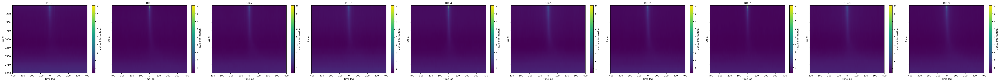

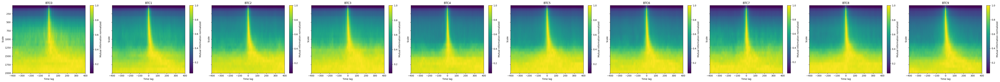

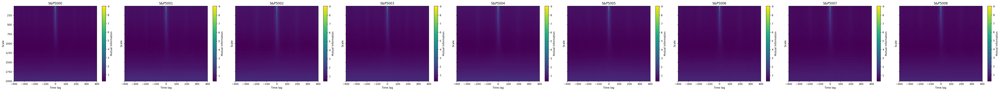

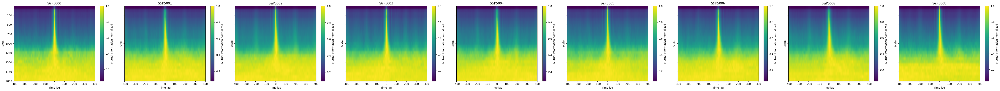

In [ ]:
plot_formated_btc = {} 
for ind, result in enumerate(BTC_results_batch):
    plot_formated_btc["BTC"+str(ind)] = result["BTC"]
plot_mi_maps(plot_formated_btc,400)
plot_formated_snp = {}
for ind, result in enumerate(SnP_results_batch):
    plot_formated_snp["S&P500"+str(ind)] = result["S&P500"]
plot_mi_maps(plot_formated_snp,400)

## diff btc

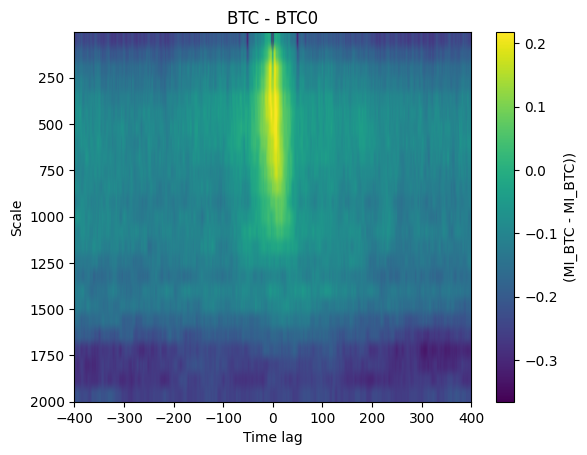

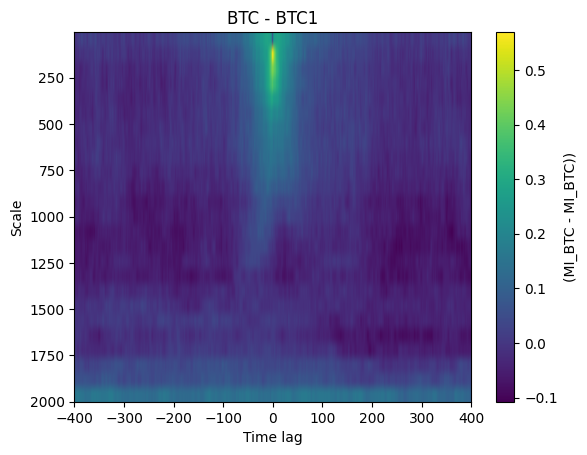

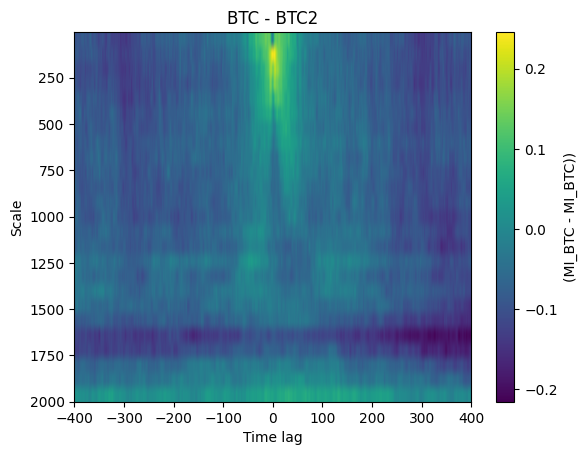

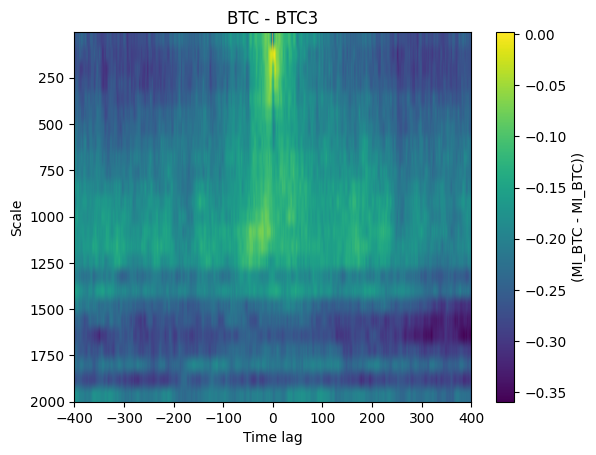

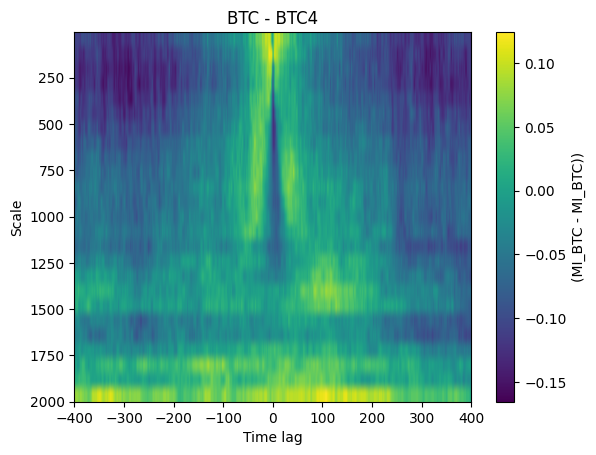

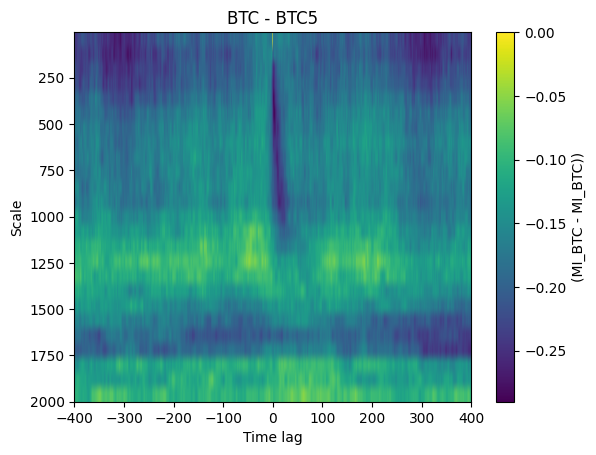

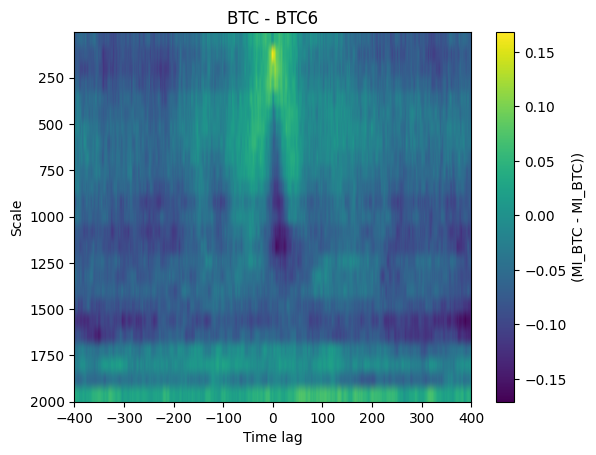

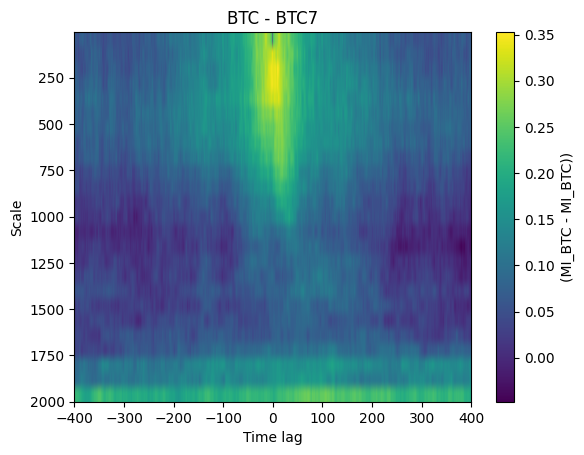

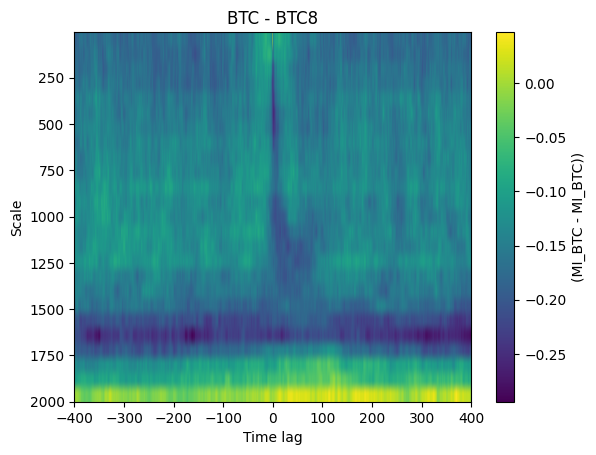

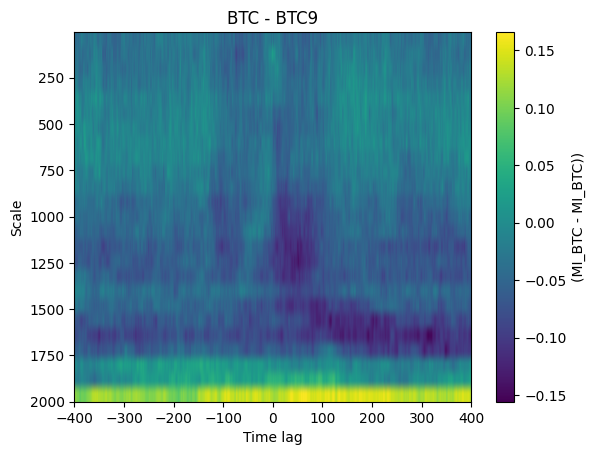

In [ ]:
for key in plot_formated_btc:
    plt.imshow(results_btc["BTC"]["mi_map"] - plot_formated_btc[key]["mi_map"], aspect="auto",extent=[-400, 400, results_btc["BTC"]["scales"][-1], results_btc["BTC"]["scales"][0]])
    plt.title(f"BTC - {key}")
    plt.xlabel('Time lag')
    plt.ylabel('Scale')
    plt.colorbar(label='(MI_BTC - MI_BTC))')
    plt.show()

## diff S&P

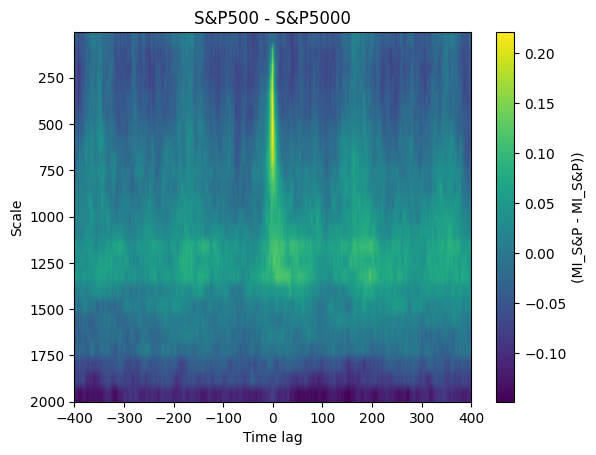

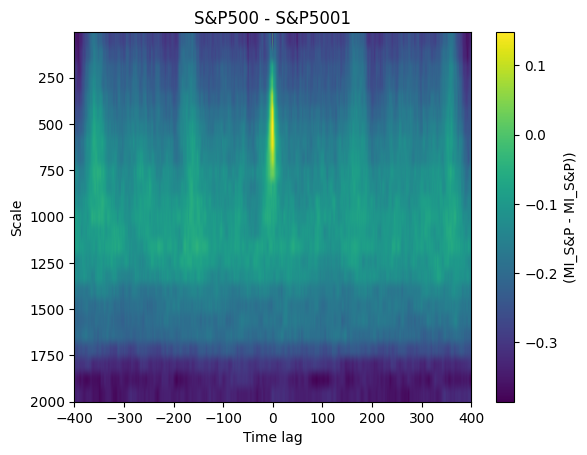

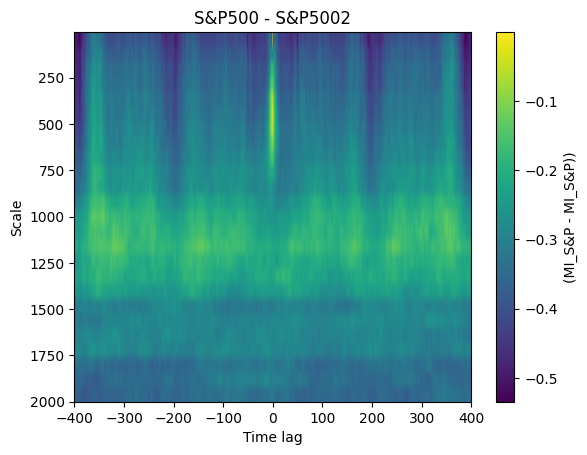

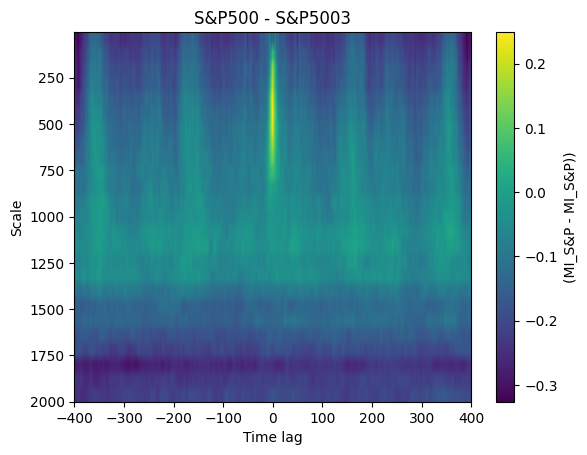

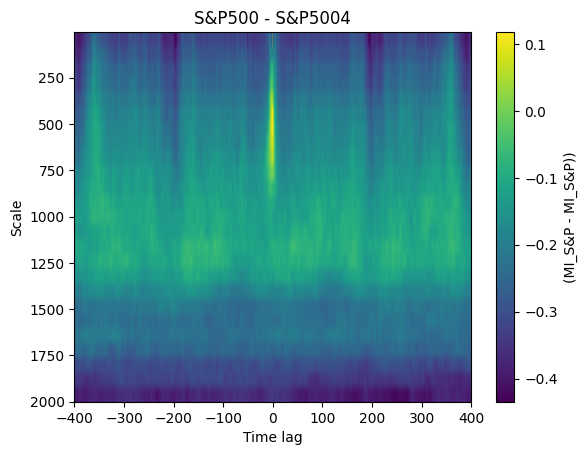

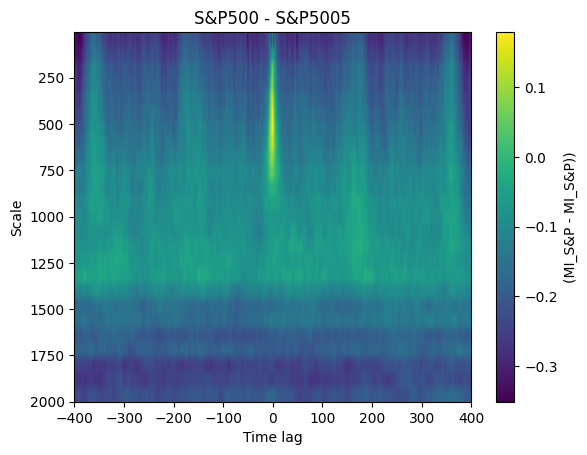

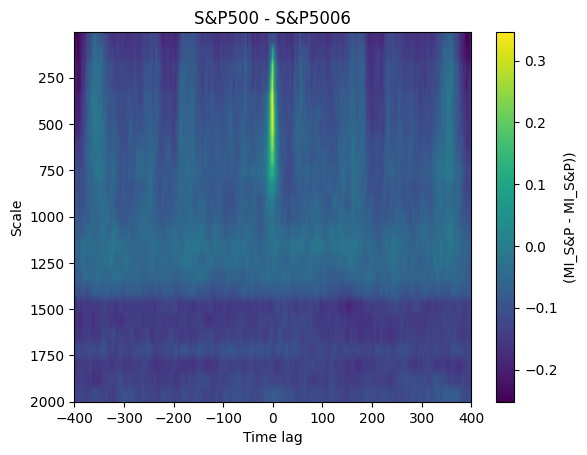

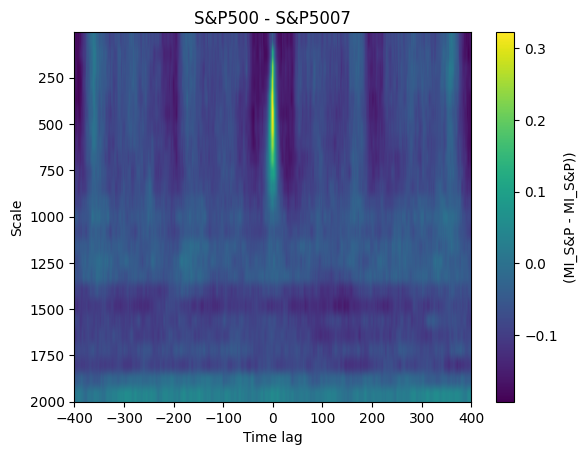

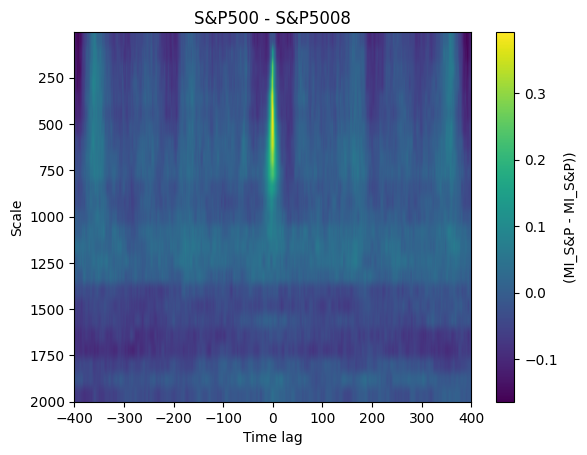

In [ ]:
for key_snp in plot_formated_snp:
    plt.imshow(results_snp["S&P500"]["mi_map"] - plot_formated_snp[key_snp]["mi_map"], aspect="auto",extent=[-400, 400, results_btc["BTC"]["scales"][-1], results_btc["BTC"]["scales"][0]])
    plt.title(f"S&P500 - {key_snp}")
    plt.xlabel('Time lag')
    plt.ylabel('Scale')
    plt.colorbar(label='(MI_S&P - MI_S&P))')
    plt.show()

In [ ]:
results_snp=np.load("mi_map_snp_-30000.npy",allow_pickle=True).item()
results_btc=np.load("mi_map_btc_-30000-.npy",allow_pickle=True).item()

## diff btc-s&p

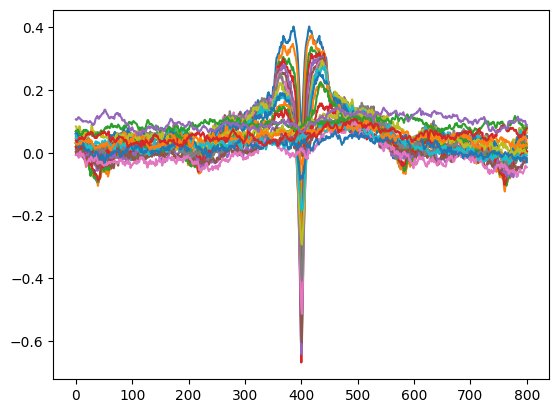

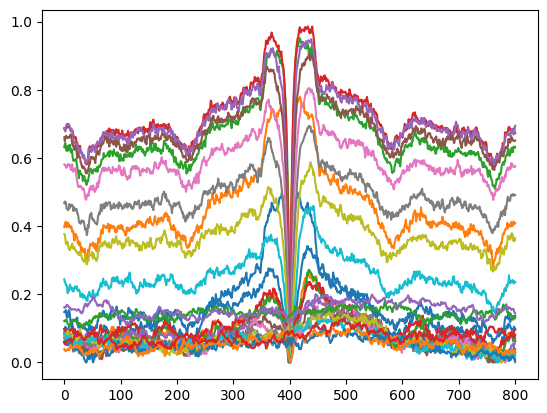

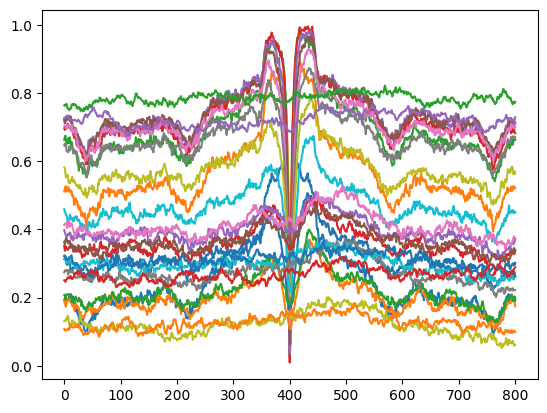

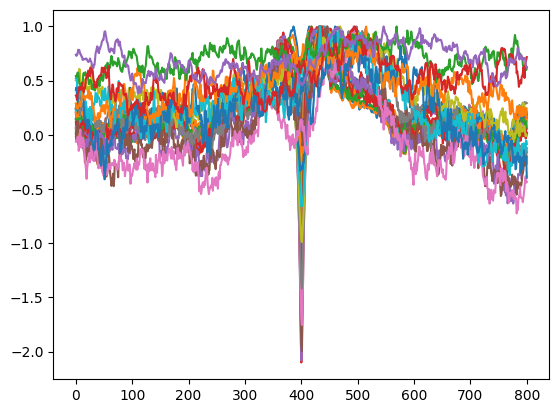

In [ ]:
for _MI in results_combined["BTC-S&P"]["mi_map"]:
    plt.plot(_MI)
plt.show()
for _MI in results_combined["BTC-S&P"]["mi_map"]:
    plt.plot(_MI+np.abs(np.min(_MI)))
plt.show()
for _MI in results_combined["BTC-S&P"]["mi_map"]:
    plt.plot((_MI+np.abs(np.min(_MI))/np.abs(np.max(_MI)-np.min(_MI))))
plt.show()
for _MI in results_combined["BTC-S&P"]["mi_map"]:
    plt.plot((_MI/np.max(_MI)))
plt.show()

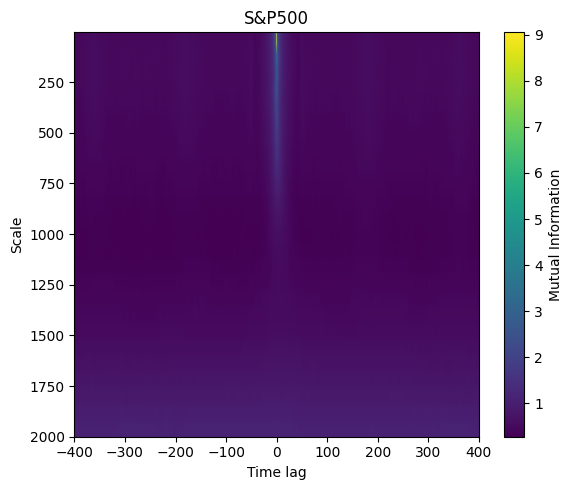

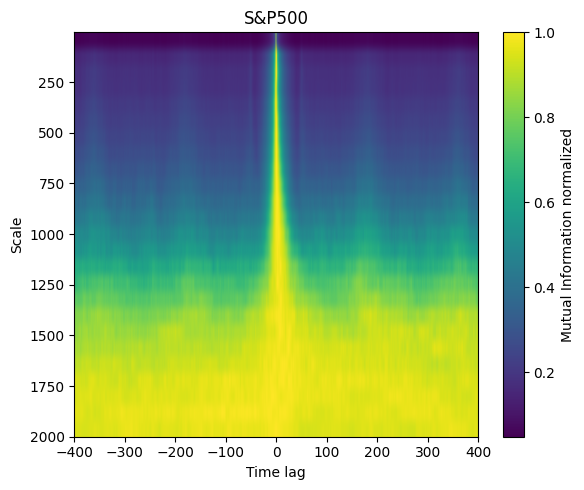

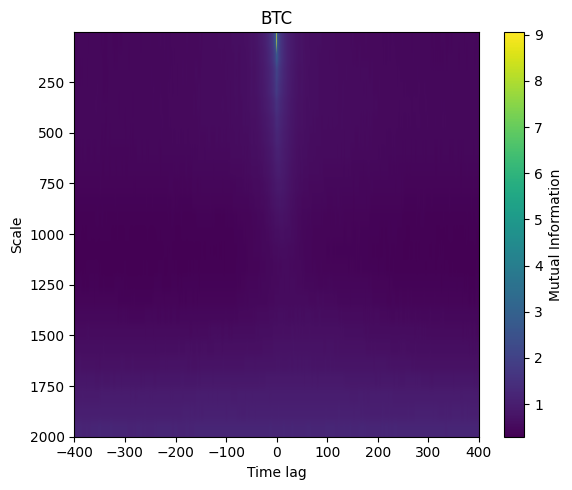

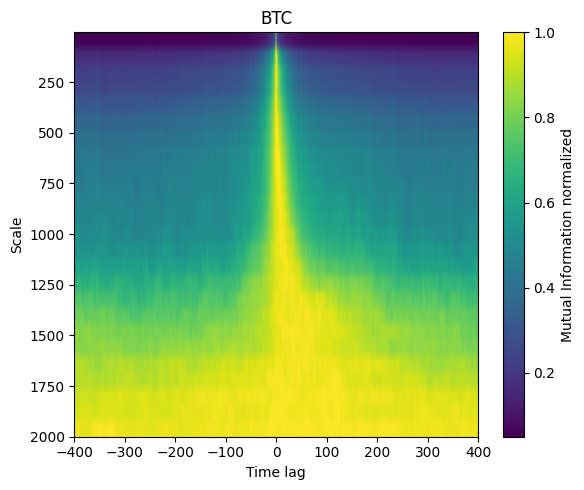

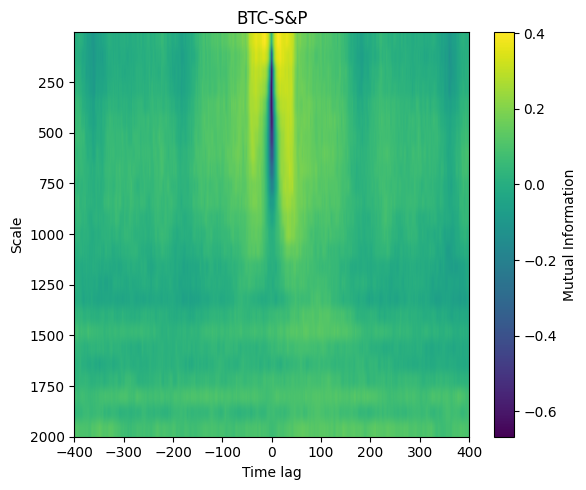

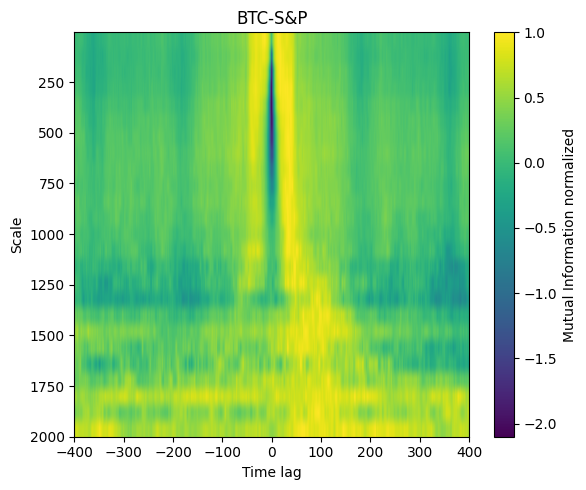

In [ ]:
results_combined = {}
results_combined["BTC-S&P"] = {}
results_combined["BTC-S&P"]["scales"] = results_btc["BTC"]["scales"]
results_combined["BTC-S&P"]["mi_map"] = results_btc["BTC"]["mi_map"]-results_snp["S&P500"]["mi_map"]
MI_s_normalized = []
for MI in results_combined["BTC-S&P"]["mi_map"]:
    MI_row = (MI+np.abs(np.min(MI))/np.abs(np.max(MI)-np.min(MI)))
    MI_s_normalized.append(MI_row)
results_combined["BTC-S&P"]["mi_map_normalized"] = MI_s_normalized
plot_mi_maps(results_snp,400)
plot_mi_maps(results_btc,400)
plot_mi_maps(results_combined,400)

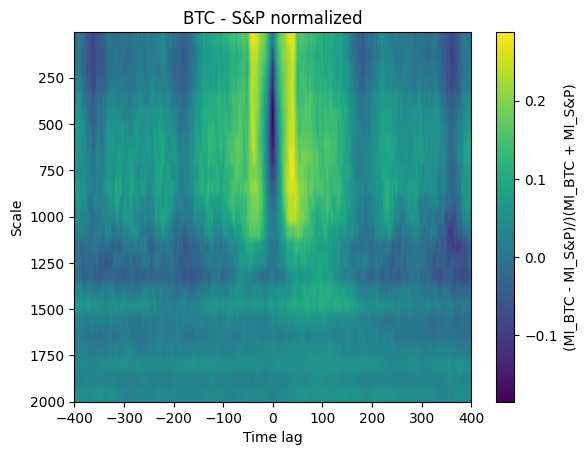

In [ ]:
results_combined["BTC-S&P"]["mi_map_normalized"] = (results_btc["BTC"]["mi_map"]-results_snp["S&P500"]["mi_map"])/(results_btc["BTC"]["mi_map"]+results_snp["S&P500"]["mi_map"])

plt.imshow(results_combined["BTC-S&P"]["mi_map_normalized"],aspect="auto",extent=[-400, 400, results_btc["BTC"]["scales"][-1], results_btc["BTC"]["scales"][0]])
plt.title("BTC - S&P normalized")
plt.xlabel('Time lag')
plt.ylabel('Scale')
plt.colorbar(label='(MI_BTC - MI_S&P)/)(MI_BTC + MI_S&P)')
plt.show()